In [1]:
# !pip install torch torchvision
# !pip install pydub pyaudio librosa
# !pip install torchaudio
# !pip install transformers
# !pip install soundfile
# !pip install jiwer
# !pip install matplotlib
# !pip install h5py

In [2]:
# !pip install librosa


In [1]:
from DataLoader import H5DataLoader
import numpy as np
import matplotlib.pyplot as plt
from pydub import AudioSegment
import os
import sys
import matplotlib.pyplot as plt
import librosa
import librosa.display
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Data Cleaning
## Loading Data from File

In [2]:
def get_file_path(identifier, person):
    data_dir = '../data/'
    # Available files
    files = os.listdir(data_dir)

    # Define the files to ignore
    files_to_ignore = ['Icon\r']

    filtered_files = [file for file in files if file not in files_to_ignore]
    print(filtered_files)
    
    # Make the search case-insensitive
    person = person.lower()
    identifier = identifier.lower()
    
    # Search for matching file
    for file in files:
        file_lower = file.lower()
        # Ignore files that don't finish in .h5
        if not file_lower.endswith('.h5'):
            continue
        if identifier.lower() in file_lower and person.lower() in file_lower:
            print("found " + data_dir + file)
            return data_dir + file
    
    # If no match is found, return a descriptive message
    error_message = f"No recording found for identifier '{identifier}' and person '{person}'"
    print(error_message)
    return None


AUDIO_SAMPLE_RATE  =  48000 #Hz
ADC_SAMPLE_RATE    =   8000 #Hz


In [3]:
PERSON = 'demo'
IDENTIFIER = 'Sam'
DATASET_PATH = get_file_path(IDENTIFIER, PERSON)

['p2SamRecoring.h5', 'p3jack.dat', 'p2Jackecording.h5', 'SamTest3.h5', 'p3SamRecordings.h5', 'SamTest.h5', 'SamTest4.h5', 'WhisperStory.h5', 'p1SamRecording.h5', 'WhisperSam.h5', 'Samrecordings.h5', 'SamPhonemeStory.h5', 'samdemo.h5', 'p3JackRecording.h5', 'p2SamPhonemes.h5', 'SamExtended.h5', 'SamTrain10words.h5']
found ../data/samdemo.h5


In [4]:
loader = H5DataLoader(DATASET_PATH)
datasets = loader.list_datasets()
print("Available datasets:", datasets)


# Check data
evaldata = loader.load_dataset(datasets[0])
print("Eval Audio :", len(evaldata["audio_data"]))
print("Eval ADC channels:", evaldata["adc_data"].keys())
print("Eval ADC ch 1:", evaldata["adc_data"][1].shape)
print("Eval ADC ch 3 :", evaldata["adc_data"][3].shape)

N_audio_samples = len(evaldata["audio_data"])
N_adc_samples = len(evaldata["adc_data"][1]) + len(evaldata["adc_data"][3])
print("Eval Audio samples:", N_audio_samples)
print("Eval ADC samples:", N_adc_samples)
ratio = N_audio_samples / N_adc_samples
print("Audio to ADC ratio:", ratio)
expected_ratio = AUDIO_SAMPLE_RATE / ADC_SAMPLE_RATE
print("Expected ratio:", expected_ratio)

Available datasets: ['ace', 'aid', 'come', 'day', 'dime', 'doom', 'dude', 'key', 'make', 'may', 'me', 'medialab', 'moo', 'moose', 'murata', 'murata2', 'my', 'ray', 'rock', 'rum', 'same', 'seam', 'seed', 'seek', 'shave', 'she', 'shock', 'shoe', 'shy', 'side', 'sigh', 'start', 'stop', 'sue', 'they', 'us', 'vase', 'wake', 'wash', 'way', 'weed', 'why', 'woo']
Eval Audio : 1300224
Eval ADC channels: dict_keys([1, 3])
Eval ADC ch 1: (108544,)
Eval ADC ch 3 : (108544,)
Eval Audio samples: 1300224
Eval ADC samples: 217088
Audio to ADC ratio: 5.98938679245283
Expected ratio: 6.0


## Data Processing using Short-Time Energy

In [5]:
import numpy as np
import matplotlib.pyplot as plt

def short_time_energy_segmentation(audio_samples, sr, 
                                   frame_duration=0.02,    # 20 ms 
                                   hop_duration=0.01,      # 10 ms
                                   smoothing_window=5,     # in frames
                                   energy_quantile=0.2,    # quantile for threshold
                                   min_silence_frames=3,   # minimum consecutive silent frames for a silence region
                                   min_voiced_frames=3     # minimum consecutive voiced frames for a speech region
                                  ):
    """
    Perform Short-Time Energy + Adaptive Thresholding segmentation.
    
    Parameters
    ----------
    audio_samples : 1D np.array
        Audio signal samples.
    sr : int
        Sample rate of the audio (samples/sec).
    frame_duration : float
        Duration of each frame in seconds (default 20 ms).
    hop_duration : float
        Hop (overlap) between frames in seconds (default 10 ms).
    smoothing_window : int
        Number of frames for smoothing the energy contour.
    energy_quantile : float
        Which quantile of the energy distribution to use for threshold. 
        For example, 0.2 = 20th percentile.
    min_silence_frames : int
        Minimum consecutive frames that must be below threshold to be considered silence.
    min_voiced_frames : int
        Minimum consecutive frames that must be above threshold to be considered speech.
    
    Returns
    -------
    segments : list of (seg_start, seg_end)
        Detected voiced (speech) segments in sample indices.
    ste : np.array
        Short-time energy array (one value per frame).
    frame_times : np.array
        Time (seconds) at the center of each frame.
    threshold : float
        Energy threshold used for classification.
    """

    # -------------------------
    # 1) Frame Setup
    # -------------------------
    frame_size = int(frame_duration * sr)
    hop_size   = int(hop_duration   * sr)

    # Make sure audio is 1D (mono)
    audio_samples = np.asarray(audio_samples).flatten()
    n_samples = len(audio_samples)

    # -------------------------
    # 2) Compute Short-Time Energy
    # -------------------------
    energies = []
    frame_times = []  # store center time of each frame
    idx = 0
    while idx + frame_size <= n_samples:
        frame = audio_samples[idx:idx + frame_size]
        ste_value = np.sum(frame**2) / frame_size
        energies.append(ste_value)

        # Time stamp for the center of the frame
        frame_center = (idx + frame_size/2.0) / sr
        frame_times.append(frame_center)

        idx += hop_size

    energies = np.array(energies)
    frame_times = np.array(frame_times)

    # -------------------------
    # 3) Smooth the Energy
    # -------------------------
    # Simple moving average over 'smoothing_window' frames
    kernel = np.ones(smoothing_window) / smoothing_window
    ste_smoothed = np.convolve(energies, kernel, mode='same')

    # -------------------------
    # 4) Adaptive Threshold
    # -------------------------
    # Example: pick the 'energy_quantile' percentile of the STE distribution
    # to serve as a baseline. Then add a factor if needed.
    threshold_value = np.quantile(ste_smoothed, energy_quantile)
    # Optionally scale that threshold:
    threshold_value *= 2.0  # e.g., multiply by 2

    # -------------------------
    # 5) Classify Frames as Voiced / Unvoiced
    # -------------------------
    voiced_frames = ste_smoothed >= threshold_value
    
    # We might want to "cleanup" tiny silences or tiny voiced pockets:
    # * Merge short voiced segments
    # * Merge short silence segments

    # We'll do a simple pass that merges short runs below/above threshold
    def merge_labels(labels, min_count, target_value):
        """
        Merge short segments of 'target_value' if they are below min_count.
        For example, merge short runs of 1's among 0's if min_count is 3.
        """
        # labels is boolean array. True=voiced, False=silence
        # We want to ensure runs of 'target_value' have at least min_count frames.
        # If not, convert them to the opposite label.
        labels_int = labels.astype(int)
        merged = labels_int.copy()
        
        i = 0
        while i < len(labels_int):
            val = labels_int[i]
            run_start = i
            while i < len(labels_int) and labels_int[i] == val:
                i += 1
            run_end = i  # one past the end
            
            run_length = run_end - run_start
            
            if val == target_value and run_length < min_count:
                # Flip them to the opposite value
                merged[run_start:run_end] = 1 - target_value
        
        return merged.astype(bool)

    # Merge short voiced frames
    voiced_frames = merge_labels(voiced_frames, min_voiced_frames, target_value=True)
    # Merge short silence frames
    voiced_frames = merge_labels(voiced_frames, min_silence_frames, target_value=False)

    # -------------------------
    # 6) Convert Frames to Time Segments
    # -------------------------
    segments = []
    in_segment = False
    seg_start = None

    for i, vf in enumerate(voiced_frames):
        if vf and not in_segment:
            # start of a segment
            in_segment = True
            seg_start = i
        elif not vf and in_segment:
            # end of a segment
            in_segment = False
            seg_end = i - 1
            # Convert frame indices to sample indices
            # We'll map to the center time of the first and last frames,
            # then expand to sample indices.
            seg_start_time = frame_times[seg_start] - (frame_duration/2)
            seg_end_time = frame_times[seg_end] + (frame_duration/2)
            sample_start = int(max(seg_start_time, 0) * sr)
            sample_end   = int(min(seg_end_time, n_samples / sr) * sr)
            segments.append((sample_start, sample_end))

    # If ended in a voiced segment
    if in_segment:
        seg_end = len(voiced_frames) - 1
        seg_start_time = frame_times[seg_start] - (frame_duration/2)
        seg_end_time   = frame_times[seg_end] + (frame_duration/2)
        sample_start   = int(max(seg_start_time, 0) * sr)
        sample_end     = int(min(seg_end_time, n_samples / sr) * sr)
        segments.append((sample_start, sample_end))

    return segments, ste_smoothed, frame_times, threshold_value


# -----------------------------------------------------
# 1) Run Short-Time Energy + Threshold Segmentation
# -----------------------------------------------------
# segments, ste, frame_times, threshold_value = short_time_energy_segmentation(
#     evaldata["audio_data"], AUDIO_SAMPLE_RATE,
#     frame_duration=0.04,
#     hop_duration=0.1,
#     smoothing_window=6,
#     energy_quantile=0.15,
#     min_silence_frames=1,
#     min_voiced_frames=2
# )

# # -----------------------------------------------------

# # 2) Visualization
# # -----------------------------------------------------

# # 2A) Plot Short-Time Energy & Threshold
# plt.figure(figsize=(12, 4))
# plt.plot(frame_times, ste, label="Short-Time Energy")
# plt.axhline(threshold_value, linestyle='--', label=f"Threshold={threshold_value:.4f}")
# plt.title("Short-Time Energy vs. Time")
# plt.xlabel("Time (sec)")
# plt.ylabel("Energy")
# plt.legend()
# plt.grid()
# plt.show()

# # 2B) Plot the Original Waveform & Highlight Detected Segments
# plt.figure(figsize=(12, 4))
# times = np.arange(len(evaldata["audio_data"])) / AUDIO_SAMPLE_RATE
# plt.plot(times, evaldata["audio_data"], label="Waveform")
# # Overlay detected segments as colored spans
# for (start_samp, end_samp) in segments:
#     plt.axvspan(start_samp/AUDIO_SAMPLE_RATE, end_samp/AUDIO_SAMPLE_RATE, color='green', alpha=0.3)
# plt.title("Waveform with Detected 'Speech' Segments")
# plt.xlabel("Time (sec)")
# plt.ylabel("Amplitude")
# plt.xlim([0, max(times)])
# plt.legend()
# plt.grid()
plt.show()


## Generating Segments based on Short-Time Energy

Dataset: ace
Dataset: aid
Dataset: come
Dataset: day
Dataset: dime
Dataset: doom
Dataset: dude
Dataset: key
Dataset: make
Dataset: may
Dataset: me
Dataset: medialab
Dataset: moo
Dataset: moose
Dataset: murata
Dataset: murata2
Dataset: my
Dataset: ray
Dataset: rock
Dataset: rum
Dataset: same
Dataset: seam


/tmp/ipykernel_254035/4195366673.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20, 10))


Dataset: seed
Dataset: seek
Dataset: shave
Dataset: she
Dataset: shock
Dataset: shoe
Dataset: shy
Dataset: side
Dataset: sigh
Dataset: start
Dataset: stop
Dataset: sue
Dataset: they
Dataset: us
Dataset: vase
Dataset: wake
Dataset: wash
Dataset: way
Dataset: weed
Dataset: why
Dataset: woo


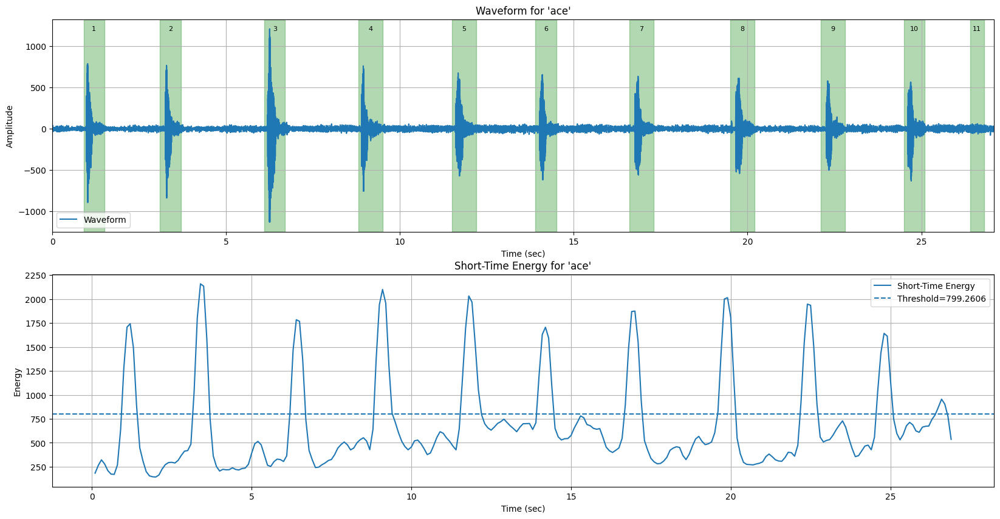

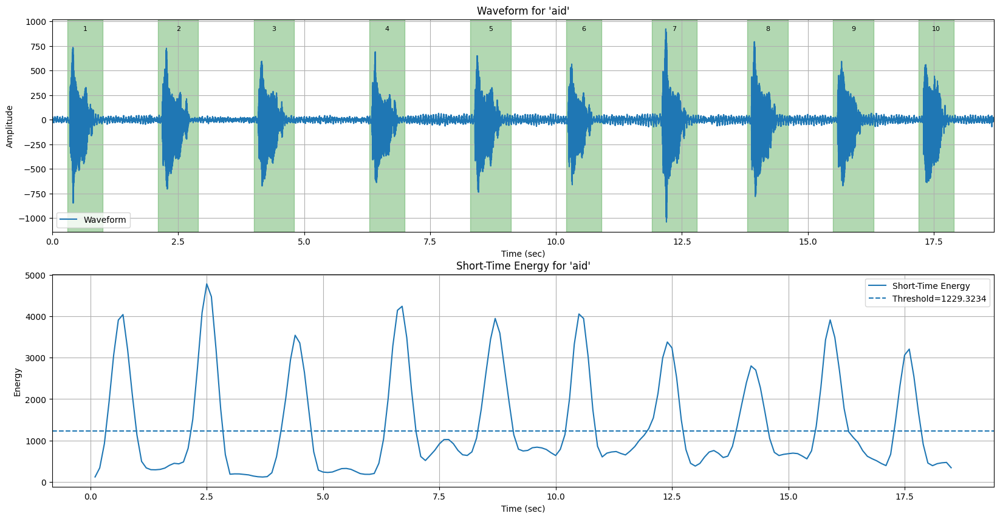

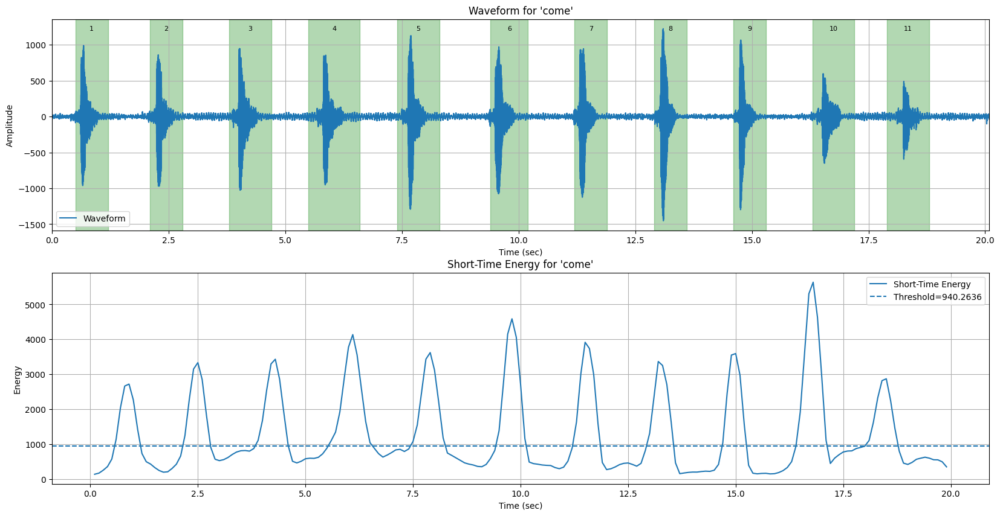

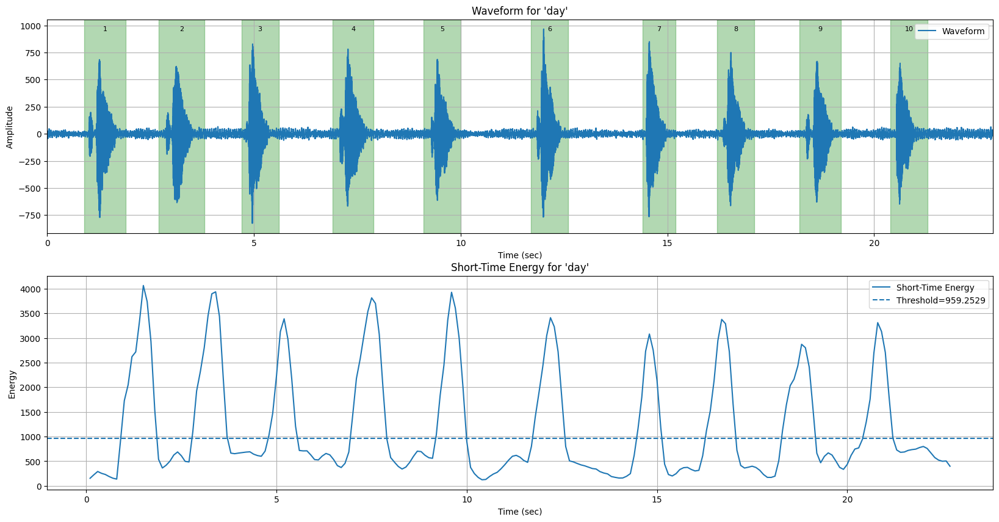

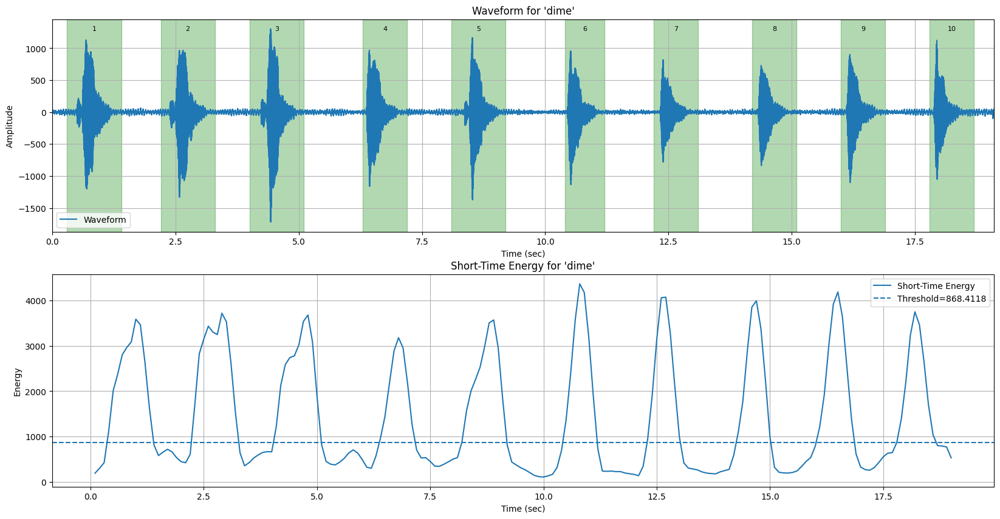

...

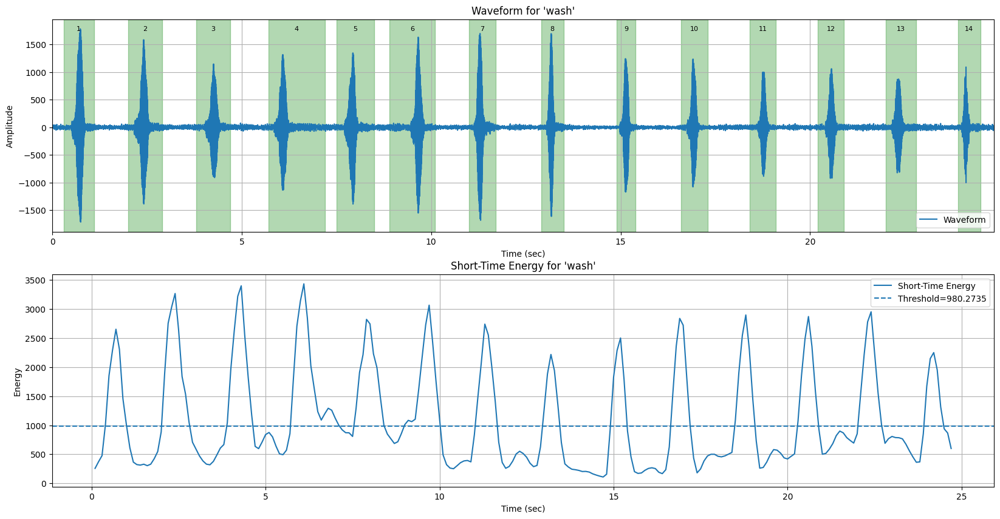

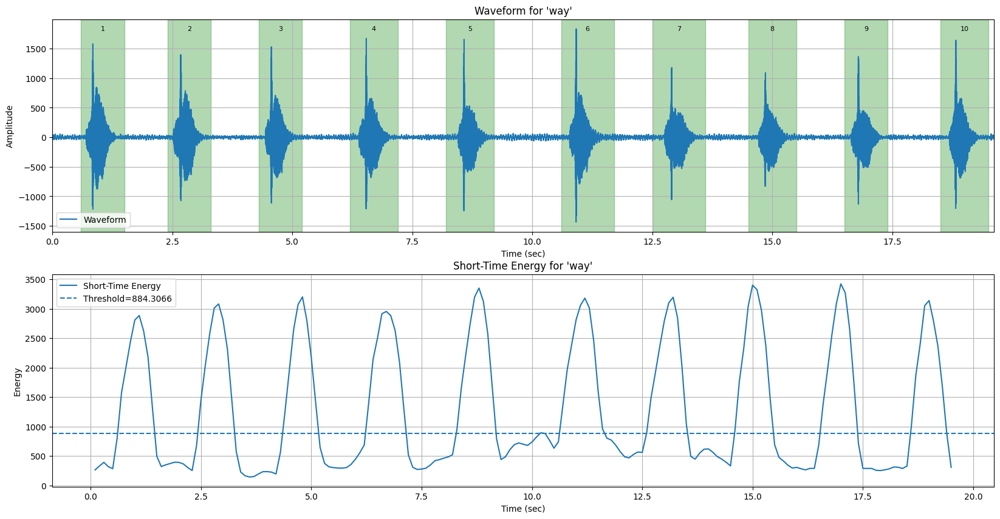

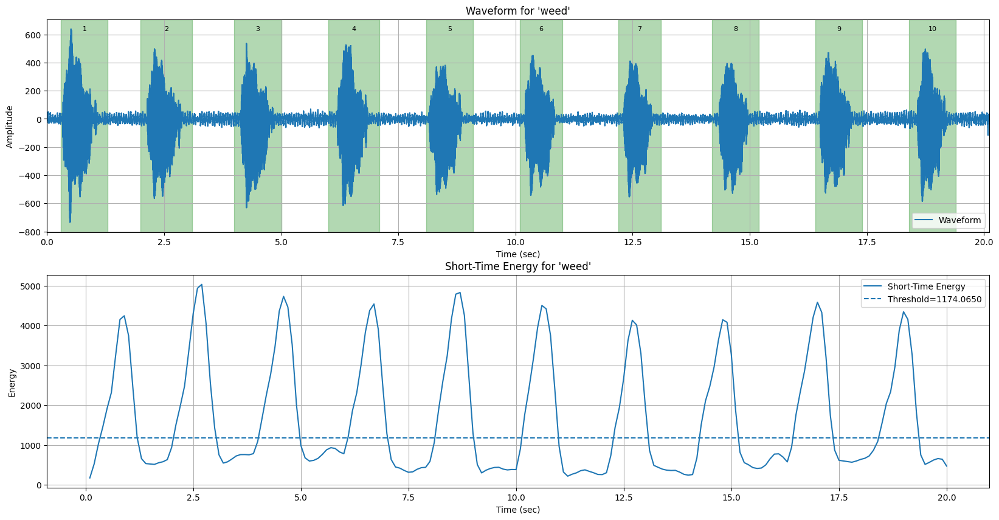

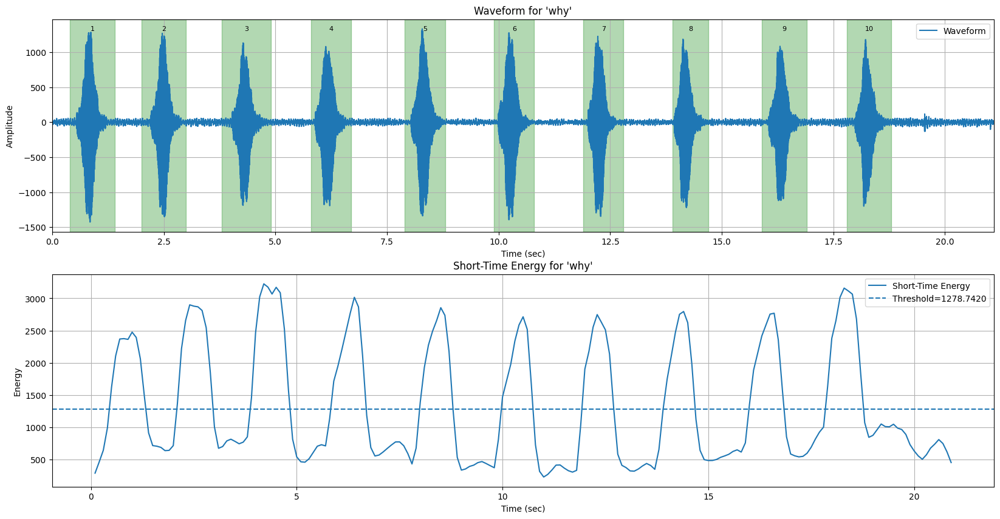

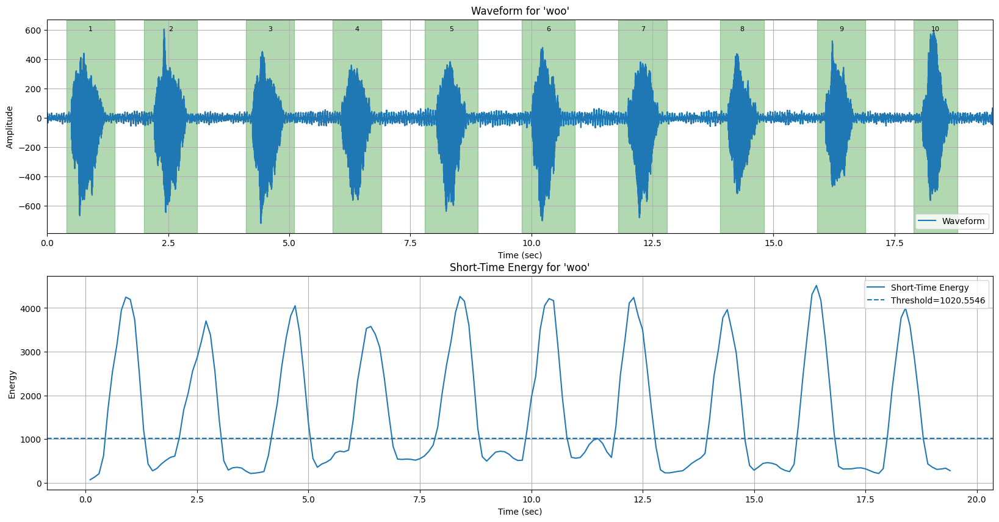

In [6]:
datasetInedex = dict()

# test it out on all the datasets
for dataset in datasets:
    print("Dataset:", dataset)
    data = loader.load_dataset(dataset)
    audio_data = data["audio_data"]
    adc_data = data["adc_data"]
    N_audio_samples = len(audio_data)
    N_adc_samples = len(adc_data[1]) + len(adc_data[3])
    # -----------------------------------------------------
    # 1) Run Short-Time Energy + Threshold Segmentation
    # -----------------------------------------------------
    segments, ste, frame_times, threshold_value = short_time_energy_segmentation(
        audio_data, AUDIO_SAMPLE_RATE,
        frame_duration=0.2,
        hop_duration=0.1,
        smoothing_window=4,
        energy_quantile=0.3,
        min_silence_frames=1,
        min_voiced_frames=3
    )
    datasetInedex[dataset] = segments
    plt.figure(figsize=(20, 10))
    plt.subplot(2, 1, 1)
    times = np.arange(len(audio_data)) / AUDIO_SAMPLE_RATE
    plt.plot(times, audio_data, label="Waveform")
    y_text = max(audio_data)
    # Overlay detected segments as colored spans
      
    for i,(start_samp, end_samp) in enumerate(segments):
        plt.axvspan(start_samp/AUDIO_SAMPLE_RATE, end_samp/AUDIO_SAMPLE_RATE, color='green', alpha=0.3)
        plt.text(
            (start_samp + end_samp) / (2 * AUDIO_SAMPLE_RATE),
            y_text,
            f"{i+1}",
            fontsize=8,
            color='black',
            ha='center',
            va='center'
        )
    plt.title(f"Waveform for '{dataset}'")
    plt.xlabel("Time (sec)")
    plt.ylabel("Amplitude")
    plt.xlim([0, max(times)])
    plt.legend()
    plt.grid()
    plt.subplot(2, 1, 2)
    plt.plot(frame_times, ste, label="Short-Time Energy")
    plt.axhline(threshold_value, linestyle='--', label=f"Threshold={threshold_value:.4f}")
    plt.title(f"Short-Time Energy for '{dataset}'")
    plt.xlabel("Time (sec)")
    plt.ylabel("Energy")
    plt.legend()
    plt.grid()

## Identifying and Removing Bad Segments

In [7]:
def get_exclude_config(person, identifier):
    """
    Returns the exclude_indexes and exclude_datasets based on person and identifier.
    
    Args:
        person (str): Person identifier ('sam' or 'jack')
        identifier (str): Dataset identifier ('p1', 'p2', 'p3', 'OG')
    
    Returns:
        tuple: (exclude_indexes, exclude_datasets)
    """
    # Configuration dictionary mapping (person, identifier) to exclude configs
    config = {
        ### SAM
        ('sam', 'OG'): {
            'exclude_indexes': {
                'Child': [31], 
                'Joyce': [1, 30],
                'Justice': [1, 2, 3],
                'Question': [1, 17, 31],
                'Thought': [1, 29],
                'Through': [32],
                'Weapons': [32],
                'XRay2': [31],
            },
            'exclude_datasets': ['NOISE', 'NOISE2', 'NOISE3', 'XRay', 'Europe']
        },
        ('sam', 'p3'): {
            'exclude_indexes': {
                'Justice': [14, 16, 27],
                'Through': [1, 20, 28, 31], 
                'Weapons': [31],
            },
            'exclude_datasets': []
        },
        ('sam', 'p2'): {
            'exclude_indexes': {
                'Justice': [3, 22, 23, 32],
                'Through': [1, 18, 19, 30],
                'Weapons': [18, 20],
            },
            'exclude_datasets': []
        },
        ('sam', 'p1'): {
            'exclude_indexes': {
                'Justice': [1, 8],
                'Weapons': [22, 29],
            },
            'exclude_datasets': []
        },
        
        ### JACK 
        ('jack', 'p2'): {
            'exclude_indexes': {
                'Child': [1], 
                'Europe': [],
                'Exactly': [30, 31],
                'Joyce': [31],
                'Justice': [31],
                'Question': [],
                'Thought': [31],
                'Through': [1],
                'Weapons': [1],
                'XRay2': [31],
            },
            'exclude_datasets': []
        },
        ('jack', 'p3'): {
            'exclude_indexes': {
                'aid':[1],
                'come':[1],
                'doom':[1],
                'seam':[31],
                'shave':[9, 12],
                'she':[1, 2 ],
                'shock':[ 15],
                'sigh':[ 1],
                'sue':[ 1, 20],
                'vase':[ 1, 2, 24],
                'weed':[ 1],
            },
            'exclude_datasets': []
        },
        ('samphonemes', 'p2'): {
            'exclude_indexes': {
                'ace':[6,7,8,33],
                'come':[1,2,3,4,5,6,7,58],
                'day':[60],
                'dime':[1],
                'key':[61],
                'make':[61 ],
                'me':[ 1],
                'ray':[ 2],
                'seek':[ 9],
                'shave':[ 60],
                'shoe':[ 1],
                'vase':[18],
                'wake':[62,19],
            },
            'exclude_datasets': []
        },
        ('test', 'sam'): {
            'exclude_indexes': {
                'seek':[1],
                'shock':[10],
                'side':[1],
                'wake':[15],
            },
            'exclude_datasets': ["jaw"]
        },
        ('extended', 'sam'): {
            'exclude_indexes': {
                'murata':[17],
                'stop':[83],
            },
            'exclude_datasets': ["jaw"]
        },
        ('test3', 'sam'): {
            'exclude_indexes': {
                'day':[1],
                'dude':[1,2,3,4],
                'may':[1],
                'rock':[29],
                'rum':[33,34],
                'seam':[1,31],
                'shock':[30],
            },
            'exclude_datasets': ["dude2"]
        },
        ('test4', 'sam'): {
            'exclude_indexes': {
                'dude':[11],
                'may':[9],
                'they':[5],
                'us':[5],
            },
            'exclude_datasets': ["ace", "ace2", "seek", "seek2"]
        },
        ('demo', 'sam'): {
            'exclude_indexes': {
                'ace':[11],
                'same':[9],
                'shock':[7],
                'shy':[7],
                'stop':[11],
                'sue':[9],
                'they':[2],
                'wake':[8],
            },
            'exclude_datasets': ["murata", "murata2"]
        },
    }
    # PERSON = 'SamPhonemes'
    # IDENTIFIER = 'p2'
    # Convert inputs to lowercase for case-insensitive matching
    person = person.lower()
    identifier = identifier.lower()
    
    # Look up the configuration
    key = (person, identifier)
    if key in config:
        return config[key]['exclude_indexes'], config[key]['exclude_datasets']
    else:
        print(f"Warning: No configuration found for {person} and {identifier}. Using empty defaults.")
        return {}, ['NOISE', 'NOISE2', 'NOISE3', 'XRay', 'Europe']

# Usage example:
exclude_indexes, exclude_datasets = get_exclude_config(PERSON, IDENTIFIER)

In [16]:
#generate "noise" sections. 
noise_segments = dict()
for dataset, segments in datasetInedex.items():
    if dataset in exclude_datasets:
        print(f"Skipping dataset '{dataset}' as it is in the exclude list.")
        continue
    noise_seg = []
    previous_end = segments[0][0]
    for i, segment in enumerate(segments[1:]):
        start, end = segment
        if start > previous_end:
            noise_seg.append((previous_end, start))
        previous_end = end
    noise_segments[dataset] = noise_seg

print("Noise Segments Detected:")
for dataset, segments in noise_segments.items():
    if dataset in exclude_datasets:
        continue
    print(f"Dataset: {dataset}, Noise Segments: {len(segments)}")

print("filtered segemnts:")
# Filter the segments
filtered_segments = dict()
for dataset, segments in datasetInedex.items():
    if dataset in exclude_datasets:
        continue
    old_size = len(segments)
    filtered_segments[dataset] = [
        segment for i, segment in enumerate(segments) 
        if i+1 not in exclude_indexes.get(dataset, [])
    ]
    new_size = len(filtered_segments[dataset])
    print(f"Dataset: {dataset}, Old size: {old_size}, New size: {new_size}")
print(filtered_segments)


Noise Segments Detected:
Dataset: ace, Noise Segments: 29
Dataset: aid, Noise Segments: 29
Dataset: come, Noise Segments: 29
Dataset: day, Noise Segments: 30
Dataset: dime, Noise Segments: 25
Dataset: doom, Noise Segments: 26
Dataset: dude, Noise Segments: 31
Dataset: dude2, Noise Segments: 29
Dataset: key, Noise Segments: 25
Dataset: make, Noise Segments: 31
Dataset: may, Noise Segments: 29
Dataset: me, Noise Segments: 29
Dataset: medialab, Noise Segments: 24
Dataset: moo, Noise Segments: 25
Dataset: moose, Noise Segments: 27
Dataset: murata, Noise Segments: 27
Dataset: my, Noise Segments: 27
Dataset: ray, Noise Segments: 28
Dataset: rock, Noise Segments: 27
Dataset: rum, Noise Segments: 33
Dataset: same, Noise Segments: 26
Dataset: seam, Noise Segments: 29
Dataset: seed, Noise Segments: 27
Dataset: seek, Noise Segments: 33
Dataset: shave, Noise Segments: 24
Dataset: she, Noise Segments: 28
Dataset: shock, Noise Segments: 29
Dataset: shoe, Noise Segments: 27
Dataset: shy, Noise Segmen

## Confirming only Good Segments

In [11]:
def plot_dataset(dataset, segments, loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE, threshold_value=None, frame_times=None, ste=None, show_plots=True):
    """
    Plot waveform, short-time energy, and ADC data for a dataset.
    
    Parameters:
    -----------
    dataset : str
        Name of the dataset to plot
    segments : list
        List of (start_sample, end_sample) tuples for each detected segment
    loader : object
        Dataset loader object with load_dataset method
    AUDIO_SAMPLE_RATE : float
        Sample rate of audio data
    ADC_SAMPLE_RATE : float
        Sample rate of ADC data
    threshold_value : float, optional
        Threshold value for short-time energy plot
    frame_times : array-like, optional
        Time values for short-time energy frames
    ste : array-like, optional
        Short-time energy values
    show_plots : bool, default=True
        If False, the function will set up the plots but not display them,
        allowing for additional modifications or saving
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The figure object containing the plots
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    print("Dataset:", dataset)
    data = loader.load_dataset(dataset)
    audio_data = data["audio_data"]
    adc_data = data["adc_data"]
    N_audio_samples = len(audio_data)
    N_adc_samples = len(adc_data[1]) + len(adc_data[3])
    
    # Calculate average ADC values if needed
    avg_adc_ch1 = np.average(adc_data[1])
    avg_adc_ch3 = np.average(adc_data[3])
    
    fig = plt.figure(figsize=(20, 10))
    
    # Audio Waveform Plot
    plt.subplot(3, 1, 1)
    times = np.arange(len(audio_data)) / AUDIO_SAMPLE_RATE
    plt.plot(times, audio_data, label="Waveform")
    y_text = max(audio_data)
    
    # Overlay detected segments as colored spans
    for i, (start_samp, end_samp) in enumerate(segments):
        plt.axvspan(start_samp/AUDIO_SAMPLE_RATE, end_samp/AUDIO_SAMPLE_RATE, color='green', alpha=0.3)
        plt.text((start_samp + end_samp) / (2 * AUDIO_SAMPLE_RATE), y_text, f"{i+1}", 
                 fontsize=8, color='black', ha='center', va='center')
    
    plt.title(f"Waveform for '{dataset}'")
    plt.xlabel("Time (sec)")
    plt.ylabel("Amplitude")
    plt.xlim([0, max(times)])
    plt.legend()
    plt.grid()
    
    # Short-Time Energy Plot (if provided)
    if frame_times is not None and ste is not None:
        plt.subplot(3, 1, 2)
        plt.plot(frame_times, ste, label="Short-Time Energy")
        
        if threshold_value is not None:
            plt.axhline(threshold_value, linestyle='--', label=f"Threshold={threshold_value:.4f}")
            
        plt.title(f"Short-Time Energy for '{dataset}'")
        plt.xlabel("Time (sec)")
        plt.ylabel("Energy")
        plt.legend()
        plt.grid()
    
    # ADC Data Plot
    plt.subplot(3, 1, 3)
    times = np.arange(len(adc_data[1])) / ADC_SAMPLE_RATE
    y_text = max(adc_data[1])
    
    print(f"ADC channels: {len(adc_data[1])}, {len(adc_data[3])}")
    
    plt.plot(times, adc_data[1] - avg_adc_ch1, label="ADC Data 1")
    plt.plot(times, adc_data[3] - avg_adc_ch3, label="ADC Data 3")
    
    for i, (start_samp, end_samp) in enumerate(segments):
        plt.axvspan(start_samp/(ADC_SAMPLE_RATE*12), end_samp/(ADC_SAMPLE_RATE*12), color='green', alpha=0.3)
        plt.text((start_samp + end_samp) / (2*(ADC_SAMPLE_RATE*12)), y_text, f"{i+1}", 
                 fontsize=8, color='black', ha='center', va='center')
                 
    plt.xlabel("Sample Number")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.title(f"ADC Data for '{dataset}'")
    
    plt.tight_layout()
    
    if show_plots:
        plt.show()
    
    return fig

# Example usage:
# # To plot a single dataset:
# plot_dataset('Through', filtered_segments['Through'], loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE, 
#              threshold_value, frame_times, ste)

# To plot all datasets:
def plot_all_datasets(filtered_segments, loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE, 
                     threshold_value=None, frame_times=None, ste=None, show_plots=False):
    """
    Plot all datasets in filtered_segments.
    
    Parameters: Same as plot_dataset, except:
    filtered_segments : dict
        Dictionary mapping dataset names to their segment lists
    """
    figures = {}
    for dataset, segments in filtered_segments.items():
        figures[dataset] = plot_dataset(dataset, segments, loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE,
                                      threshold_value, frame_times, ste, show_plots)
    return figures

In [12]:
# plot_all_datasets(filtered_segments, loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE, threshold_value, frame_times, ste)

# Filtering Signals
## Add Band-Pass Filter

In [13]:
!pip install scipy 


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [14]:
from scipy import signal
import numpy as np
import json
import os

audiosegmentsX = []
adc1segmentsX = []
adc2segmentsX = []
segmentsY = []
audio_sampling_rate = 48000
adc_sampling_rate = 8000

# New cutoff frequencies
audio_lowcut = 300  # Low cutoff for audio (Hz)
audio_highcut = 4000  # High cutoff for audio (Hz)
adc_lowcut = 5        # Low cutoff for ADC (Hz)
adc_highcut = 3700    # High cutoff for ADC (Hz)

def BPfilter(data, fs, lowcut_hz=None, highcut_hz=None):
    """
    Apply a bandpass Butterworth filter to the input data.
    
    Parameters:
    data : array-like
        The input signal to filter
    fs : float
        Sampling frequency in Hz
    lowcut_hz : float, optional
        Lower cutoff frequency in Hz. If None, defaults to 20 Hz
    highcut_hz : float, optional
        Upper cutoff frequency in Hz. If None, defaults to fs/4 Hz
        
    Returns:
    array-like
        The filtered signal
    """
    # Default cutoff frequencies if not provided
    if lowcut_hz is None:
        lowcut_hz = 20  # Default lower cutoff
    
    if highcut_hz is None:
        highcut_hz = fs / 4  # Default upper cutoff at quarter of sampling rate
    
    # Convert cutoff frequencies to normalized units (0 to 1)
    nyquist = fs / 2
    low = lowcut_hz / nyquist
    high = highcut_hz / nyquist
    
    # Create a 4th-order bandpass Butterworth filter
    b, a = signal.butter(2, [low, high], btype='band')
    
    # Apply zero-phase filtering using filtfilt
    filtered_data = signal.filtfilt(b, a, data)
    return filtered_data

def process_segments(
    segments, 
    identifier, 
    person, 
    loader, 
    filtered=True, 
    test=False
):
    """
    Process segments and save memmap + JSON files. 

    If test=False (default):
       - Export one entry per segment. (Original behavior)
    If test=True:
       - Export one entry per dataset, spanning from the earliest start
         to the latest end of all segments in that dataset. 
         Everything outside a labeled segment is assigned ID=-1.
    
    Parameters:
    -----------
    segments : dict
        Dictionary: { dataset_name : [ (start_samp, end_samp), ... ] }
    identifier : str
        Identifier for output files
    person : str
        Person identifier for output files
    loader : object
        Dataset loader with a `load_dataset` method returning e.g. 
        {
          "audio_data": np.array(...),
          "adc_data": {...} 
        }
    filtered : bool, optional
        Whether to apply bandpass filter to segments
    test : bool, optional
        If True, combine all segments (per dataset) into one big chunk 
        from earliest start to latest end, with ID array marking 
        segments vs noise. Defaults to False (original segment-level export).

    Returns:
    --------
    audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY
    """
    audiosegmentsX = []
    adc1segmentsX = []
    adc2segmentsX = []
    segmentsY = []

    # ----------------------------------------------------
    # If test=False, do the original, per-segment approach
    # ----------------------------------------------------
    if not test:
        # Determine maximum segment length across ALL segments
        max_audio_len = max(end_samp - start_samp 
                            for segs in segments.values() 
                            for start_samp, end_samp in segs)
        max_adc_len = max_audio_len // 12
        n_segments = sum(len(segs) for segs in segments.values())
        
        memmap_filename = f"{identifier}{person}_{'filtered' if filtered else 'noise'}.dat"

        # Delete memmap file if it exists
        if os.path.exists(memmap_filename):
            os.remove(memmap_filename)

        dtype = np.dtype([
            ('id', np.int32),
            ('audio', np.float32, (max_audio_len,)),
            ('adc1', np.float32, (max_adc_len,)),
            ('adc2', np.float32, (max_adc_len,))
        ])

        mm = np.memmap(memmap_filename, dtype=dtype, mode='w+', shape=(n_segments,))
        id2dataset = {}
        currentid = -1
        iterator = 0

        for dataset, segs in segments.items():
            currentid += 1
            data = loader.load_dataset(dataset)
            audio_data = data["audio_data"]
            adc_data = data["adc_data"]
            id2dataset[currentid] = dataset

            for start_samp, end_samp in segs:
                audioblock = audio_data[start_samp:end_samp]
                adc1block = adc_data[1][start_samp // 12 : end_samp // 12]
                adc2block = adc_data[3][start_samp // 12 : end_samp // 12]

                # Save the ID
                mm['id'][iterator] = currentid

                # Pad audio
                padded_audio = np.ones(max_audio_len, dtype=np.float32) * np.inf
                padded_audio[:len(audioblock)] = audioblock
                mm['audio'][iterator] = padded_audio

                # Pad ADC1
                padded_adc1 = np.ones(max_adc_len, dtype=np.float32) * np.inf
                padded_adc1[:len(adc1block)] = adc1block
                mm['adc1'][iterator] = padded_adc1

                # Pad ADC2
                padded_adc2 = np.ones(max_adc_len, dtype=np.float32) * np.inf
                padded_adc2[:len(adc2block)] = adc2block
                mm['adc2'][iterator] = padded_adc2

                # Optionally filter
                if filtered:
                    audiosegmentsX.append(
                        BPfilter(audioblock, audio_sampling_rate, audio_lowcut, audio_highcut)
                    )
                    adc1segmentsX.append(
                        BPfilter(adc1block, adc_sampling_rate, adc_lowcut, adc_highcut)
                    )
                    adc2segmentsX.append(
                        BPfilter(adc2block, adc_sampling_rate, adc_lowcut, adc_highcut)
                    )

                segmentsY.append(dataset)
                iterator += 1

        mm.flush()

        # Compute stats on all ADC values across all segments
        all_adc_values = []
        for dataset, segs in segments.items():
            data = loader.load_dataset(dataset)
            adc_data = data["adc_data"]
            for start_samp, end_samp in segs:
                adc1block = adc_data[1][start_samp // 12 : end_samp // 12]
                adc2block = adc_data[3][start_samp // 12 : end_samp // 12]
                all_adc_values.extend(adc1block)
                all_adc_values.extend(adc2block)

        mean_adc = np.mean(all_adc_values)
        std_adc = np.std(all_adc_values)
        print(f"Mean ADC value across all segments: {mean_adc:.4f}")
        print(f"Standard Deviation of ADC values across all segments: {std_adc:.4f}")

        # Save descriptors
        descriptor_dict = {
            'audio_sampling_rate': audio_sampling_rate,
            'adc_sampling_rate': adc_sampling_rate,
            'audio_lowcut': audio_lowcut,
            'audio_highcut': audio_highcut,
            'adc_lowcut': adc_lowcut,
            'adc_highcut': adc_highcut,
            'max_audio_len': max_audio_len,
            'max_adc_len': max_adc_len,
            'adc_mean': mean_adc,
            'adc_std': std_adc,
            'n_segments': n_segments,
            'memmap_filename': memmap_filename,
            'dataset_mapping': id2dataset,
            'dtype': dtype.descr
        }

        descriptor_filename = f"{identifier}{person}_{'filtered' if filtered else 'noise'}_descriptor.json"
        with open(descriptor_filename, 'w') as f:
            json.dump(descriptor_dict, f)

        mapping_filename = f"{identifier}{person}_{'filtered' if filtered else 'noise'}_id2dataset.json"
        with open(mapping_filename, 'w') as f:
            json.dump(id2dataset, f)

        print(f"Data saved to {memmap_filename}")
        print(f"Descriptor saved to {descriptor_filename}")
        print(f"Mapping saved to {mapping_filename}")

        return audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY

    # ------------------------------------------------------
    # If test=True, export one row per dataset, from earliest
    # start to latest end of that dataset, ID = -1 for noise
    # ------------------------------------------------------
    else:
        # First, for each dataset, figure out earliest start and latest end.
        # We'll also find the largest "span" among all datasets (for padding).
        dataset_minmax = {}
        global_min_start = None
        global_max_end = None

        for dataset, segs in segments.items():
            min_start = min(s[0] for s in segs)
            max_end   = max(s[1] for s in segs)
            dataset_minmax[dataset] = (min_start, max_end)

            # track global min and max to find the largest chunk
            if global_min_start is None or min_start < global_min_start:
                global_min_start = min_start
            if global_max_end is None or max_end > global_max_end:
                global_max_end = max_end

        # The largest possible length for audio (for padding):
        max_audio_len = global_max_end - global_min_start
        # For ADC signals, 1/12 the sampling:
        max_adc_len = max_audio_len // 12

        # We'll have one memmap row per dataset
        n_datasets = len(segments)

        memmap_filename = f"{identifier}{person}_{'filtered' if filtered else 'noise'}_test.dat"
        if os.path.exists(memmap_filename):
            os.remove(memmap_filename)

        dtype = np.dtype([
            ('id', np.int32, (max_audio_len,)),   # an ID array of length max_audio_len
            ('audio', np.float32, (max_audio_len,)),
            ('adc1', np.float32, (max_adc_len,)),
            ('adc2', np.float32, (max_adc_len,))
        ])

        mm = np.memmap(memmap_filename, dtype=dtype, mode='w+', shape=(n_datasets,))
        id2dataset = {}
        currentid = -1

        # We'll also gather stats for ADC across all datasets
        all_adc_values = []
        dataset_idx = 0

        # Sort or just iterate in insertion order
        for dataset, segs in segments.items():
            currentid += 1
            id2dataset[currentid] = dataset

            data = loader.load_dataset(dataset)
            audio_data = data["audio_data"]
            adc_data = data["adc_data"]

            min_start, max_end = dataset_minmax[dataset]
            audio_span = max_end - min_start
            adc_span   = audio_span // 12

            # Extract the entire chunk
            audio_chunk = audio_data[min_start:max_end]
            adc1_chunk  = adc_data[1][min_start // 12 : max_end // 12]
            adc2_chunk  = adc_data[3][min_start // 12 : max_end // 12]

            # Optionally filter the entire chunk
            if filtered:
                audio_chunk = BPfilter(audio_chunk, audio_sampling_rate, audio_lowcut, audio_highcut)
                adc1_chunk  = BPfilter(adc1_chunk,  adc_sampling_rate, adc_lowcut, adc_highcut)
                adc2_chunk  = BPfilter(adc2_chunk,  adc_sampling_rate, adc_lowcut, adc_highcut)

            # Build the ID array for this dataset's chunk: fill with -1
            id_array = np.full((max_audio_len,), -1, dtype=np.int32)

            # For each segment of this dataset, fill with the dataset ID
            for start_samp, end_samp in segs:
                # Shift by min_start so that index 0 corresponds to min_start
                rel_start = start_samp - min_start
                rel_end   = end_samp - min_start
                id_array[rel_start:rel_end] = currentid

            # Pad audio_chunk to max_audio_len
            padded_audio = np.zeros((max_audio_len,), dtype=np.float32)
            padded_audio[:audio_span] = audio_chunk

            # Pad adc1_chunk and adc2_chunk
            padded_adc1 = np.zeros((max_adc_len,), dtype=np.float32)
            padded_adc2 = np.zeros((max_adc_len,), dtype=np.float32)
            padded_adc1[:adc_span] = adc1_chunk[:adc_span]
            padded_adc2[:adc_span] = adc2_chunk[:adc_span]

            # Write to memmap
            mm['id'][dataset_idx] = id_array
            mm['audio'][dataset_idx] = padded_audio
            mm['adc1'][dataset_idx] = padded_adc1
            mm['adc2'][dataset_idx] = padded_adc2

            # Collect these for returning
            audiosegmentsX.append(audio_chunk)
            adc1segmentsX.append(adc1_chunk)
            adc2segmentsX.append(adc2_chunk)
            segmentsY.append(dataset)

            # For stats
            all_adc_values.extend(adc1_chunk)
            all_adc_values.extend(adc2_chunk)

            dataset_idx += 1

        mm.flush()

        # Compute ADC stats across all test-chunks
        mean_adc = np.mean(all_adc_values)
        std_adc = np.std(all_adc_values)
        print(f"[TEST=True] Mean ADC value: {mean_adc:.4f}")
        print(f"[TEST=True] Std ADC value : {std_adc:.4f}")

        descriptor_dict = {
            'mode': 'test',
            'audio_sampling_rate': audio_sampling_rate,
            'adc_sampling_rate': adc_sampling_rate,
            'audio_lowcut': audio_lowcut,
            'audio_highcut': audio_highcut,
            'adc_lowcut': adc_lowcut,
            'adc_highcut': adc_highcut,
            'max_audio_len': max_audio_len,
            'max_adc_len': max_adc_len,
            'adc_mean': mean_adc,
            'adc_std': std_adc,
            'n_datasets': n_datasets,
            'memmap_filename': memmap_filename,
            'dataset_mapping': id2dataset,
            'dtype': dtype.descr
        }

        descriptor_filename = f"{identifier}{person}_{'filtered' if filtered else 'noise'}_test_descriptor.json"
        with open(descriptor_filename, 'w') as f:
            json.dump(descriptor_dict, f)

        mapping_filename = f"{identifier}{person}_{'filtered' if filtered else 'noise'}_test_id2dataset.json"
        with open(mapping_filename, 'w') as f:
            json.dump(id2dataset, f)

        print(f"[TEST=True] Data saved to {memmap_filename}")
        print(f"[TEST=True] Descriptor saved to {descriptor_filename}")
        print(f"[TEST=True] Mapping saved to {mapping_filename}")

        return audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY

    
# audiosegmentsX, adc1segmentsX, adc2segmentsX , segmentsY = process_segments(filtered_segments, IDENTIFIER, PERSON, loader, filtered=True)
# process_segments(noise_segments, IDENTIFIER, PERSON, loader, filtered=False)
# process_segments(filtered_segments, IDENTIFIER, PERSON, loader, filtered=False, test=True)
print("Processed filtered segments and noise segments successfully.")


Processed filtered segments and noise segments successfully.


In [15]:
# import json
# import numpy as np
# import os

# def unify_datasets(
#     desc_path1, 
#     desc_path2, 
#     out_identifier="unified"
# ):
#     """
#     Unify two memmap datasets (described by two JSON descriptor files) into one.
    
#     Parameters
#     ----------
#     desc_path1 : str
#         Path to the first descriptor JSON.
#     desc_path2 : str
#         Path to the second descriptor JSON.
#     out_identifier : str, optional
#         Prefix for the output memmap and JSON descriptors.

#     Returns
#     -------
#     str
#         Path to the new unified descriptor JSON.
#     """

#     # 1) Load descriptor files
#     with open(desc_path1, 'r') as f:
#         desc1 = json.load(f)
#     with open(desc_path2, 'r') as f:
#         desc2 = json.load(f)

#     memmap_path1 = desc1["memmap_filename"]
#     memmap_path2 = desc2["memmap_filename"]

#     # 2) Infer if test-style or segment-style
#     # We'll guess from the dtype: if 'id' has shape or not
#     # We can check 'dtype' from the descriptor.
#     # For simplicity, let's parse the shape from desc1['dtype'] or desc2['dtype'].
#     # This is purely to see if id is an array or a single int.
#     # We'll assume they match; if not, raise an error.
#     dt_descr1 = desc1["dtype"]
#     dt_descr2 = desc2["dtype"]
    
#     # Check if 'id' is an array or single int:
#     # Example dt_descr might look like: [('id', '<i4'), ('audio', '<f4', (max_audio_len,)), ...]
#     # or if test=True, 'id' might have shape (max_audio_len,).
    
#     def is_test_dtype(dtype_descr):
#         # Find the 'id' entry
#         for entry in dtype_descr:
#             if entry[0] == 'id':
#                 if len(entry) >= 3 and isinstance(entry[2], tuple):
#                     # If it's something like (np.int32, (max_audio_len,))
#                     return True
#                 else:
#                     # Single integer shape => test=False
#                     return False
#         return False  # Fallback

#     test_mode_1 = is_test_dtype(dt_descr1)
#     test_mode_2 = is_test_dtype(dt_descr2)

#     if test_mode_1 != test_mode_2:
#         raise ValueError(
#             "Cannot unify: first dataset has test_mode={}, second has test_mode={}".format(
#                 test_mode_1, test_mode_2
#             )
#         )

#     # 3) Combine dataset mappings
#     # desc1['dataset_mapping'] : str->int or int->str. 
#     # In your code, it's typically { id : dataset_name }, so invert it for unifying.
#     # We'll produce new_id->dataset_name, new_dataset_name->new_id
#     old_id2name_1 = desc1['dataset_mapping']  # { str(id): dataset_name, ... } or int keys
#     old_id2name_2 = desc2['dataset_mapping']
#     # Depending on JSON dump, keys might be strings, so convert them to int if needed
#     id2name_1 = {}
#     for k, v in old_id2name_1.items():
#         id2name_1[int(k)] = v
#     id2name_2 = {}
#     for k, v in old_id2name_2.items():
#         id2name_2[int(k)] = v

#     # Invert them: dataset_name -> old_id
#     name2id_1 = {v: k for k, v in id2name_1.items()}
#     name2id_2 = {v: k for k, v in id2name_2.items()}

#     all_dataset_names = set(name2id_1.keys()).union(set(name2id_2.keys()))

#     new_id2name = {}
#     new_name2id = {}

#     next_id = 0
#     for ds_name in sorted(all_dataset_names):
#         # If ds_name is in both, we can re-use the ID from the first (for example).
#         # But if it doesn't exist in the first, or we want to unify differently,
#         # we can do a consistent approach below.
#         # We'll keep the ID from dataset1 if ds_name is in dataset1:
#         if ds_name in name2id_1:
#             old_id = name2id_1[ds_name]
#             if ds_name in name2id_2:
#                 # ds_name is in both => unify on old_id from dataset1
#                 # but we do not require that old_id_1 == old_id_2
#                 # We'll just adopt old_id_1
#                 new_id = next_id
#                 new_id2name[new_id] = ds_name
#                 new_name2id[ds_name] = new_id
#                 next_id += 1
#             else:
#                 # ds_name is only in dataset1
#                 new_id = next_id
#                 new_id2name[new_id] = ds_name
#                 new_name2id[ds_name] = new_id
#                 next_id += 1
#         else:
#             # ds_name is only in dataset2
#             new_id = next_id
#             new_id2name[new_id] = ds_name
#             new_name2id[ds_name] = new_id
#             next_id += 1

#     # We'll unify the total # of segments or rows
#     n1 = desc1["n_segments"] if not test_mode_1 else desc1["n_datasets"]
#     n2 = desc2["n_segments"] if not test_mode_2 else desc2["n_datasets"]
#     n_total = n1 + n2

#     # 4) Determine new padded shapes
#     new_max_audio_len = max(desc1["max_audio_len"], desc2["max_audio_len"])
#     new_max_adc_len   = max(desc1["max_adc_len"], desc2["max_adc_len"])

#     # 5) Build the new dtype
#     # Are we in test mode? => 'id' is an array. Otherwise, single int.
#     if test_mode_1:
#         # 'id' is array
#         new_dtype = np.dtype([
#             ('id', np.int32, (new_max_audio_len,)),
#             ('audio', np.float32, (new_max_audio_len,)),
#             ('adc1', np.float32, (new_max_adc_len,)),
#             ('adc2', np.float32, (new_max_adc_len,))
#         ]), 
#     else:
#         # 'id' is single int
#         new_dtype = np.dtype([
#             ('id', np.int32),
#             ('audio', np.float32, (new_max_audio_len,)),
#             ('adc1', np.float32, (new_max_adc_len,)),
#             ('adc2', np.float32, (new_max_adc_len,))
#         ])

#     # Create the new memmap filename
#     new_memmap_filename = f"{out_identifier}_unified.dat"
#     if os.path.exists(new_memmap_filename):
#         os.remove(new_memmap_filename)

#     mm_new = np.memmap(
#         new_memmap_filename,
#         dtype=new_dtype,
#         mode='w+',
#         shape=(n_total,)
#     )

#     # 6) Open the old memmaps in read mode
#     mm1 = np.memmap(memmap_path1, dtype=np.dtype(dt_descr1), mode='r', shape=(n1,))
#     mm2 = np.memmap(memmap_path2, dtype=np.dtype(dt_descr2), mode='r', shape=(n2,))

#     # Helper to unify "id" integer or "id" array
#     def unify_id_field(old_id_field, old_id2name_dict, is_test):
#         """
#         Convert an old 'id' (int or array) to the new ID or new ID array 
#         according to the new_name2id mapping. 
#         If is_test=True, old_id_field is an array. 
#         If is_test=False, old_id_field is just a single int.
#         """
#         if not is_test:
#             old_id = int(old_id_field)  # single int
#             old_ds_name = old_id2name_dict[old_id]
#             new_id = new_name2id[old_ds_name]
#             return new_id
#         else:
#             # old_id_field is an array of ints
#             # We must map each int to new int. -1 remains -1
#             # old_id => old dataset name => new id
#             new_array = np.full_like(old_id_field, -1)
#             unique_ids = np.unique(old_id_field)
#             for old_id in unique_ids:
#                 if old_id == -1:
#                     continue
#                 # map the old ID
#                 ds_name = old_id2name_dict[int(old_id)]
#                 n_id = new_name2id[ds_name]
#                 # assign
#                 new_array[old_id_field == old_id] = n_id
#             return new_array

#     write_index = 0

#     # 7a) Write from mm1
#     for i in range(n1):
#         if test_mode_1:
#             # 'id' is an array
#             old_id_array = mm1['id'][i]
#             new_id_array = unify_id_field(old_id_array, id2name_1, is_test=True)
#             mm_new['id'][write_index] = new_id_array
#         else:
#             # single int
#             old_id_val = mm1['id'][i]
#             new_id_val = unify_id_field(old_id_val, id2name_1, is_test=False)
#             mm_new['id'][write_index] = new_id_val

#         # Now unify audio + pad
#         old_audio = mm1['audio'][i]
#         # old_audio shape might be smaller or bigger than new_max_audio_len 
#         # but it should be exactly desc1["max_audio_len"]. We'll copy up to min
#         copy_len_audio = min(old_audio.shape[0], new_max_audio_len)
#         new_audio = np.zeros((new_max_audio_len,), dtype=np.float32)
#         new_audio[:copy_len_audio] = old_audio[:copy_len_audio]
#         mm_new['audio'][write_index] = new_audio

#         # unify adc1
#         old_adc1 = mm1['adc1'][i]
#         copy_len_adc = min(old_adc1.shape[0], new_max_adc_len)
#         new_adc1 = np.zeros((new_max_adc_len,), dtype=np.float32)
#         new_adc1[:copy_len_adc] = old_adc1[:copy_len_adc]
#         mm_new['adc1'][write_index] = new_adc1

#         # unify adc2
#         old_adc2 = mm1['adc2'][i]
#         new_adc2 = np.zeros((new_max_adc_len,), dtype=np.float32)
#         new_adc2[:copy_len_adc] = old_adc2[:copy_len_adc]
#         mm_new['adc2'][write_index] = new_adc2

#         write_index += 1

#     # 7b) Write from mm2
#     for i in range(n2):
#         if test_mode_2:
#             old_id_array = mm2['id'][i]
#             new_id_array = unify_id_field(old_id_array, id2name_2, is_test=True)
#             mm_new['id'][write_index] = new_id_array
#         else:
#             old_id_val = mm2['id'][i]
#             new_id_val = unify_id_field(old_id_val, id2name_2, is_test=False)
#             mm_new['id'][write_index] = new_id_val

#         old_audio = mm2['audio'][i]
#         copy_len_audio = min(old_audio.shape[0], new_max_audio_len)
#         new_audio = np.zeros((new_max_audio_len,), dtype=np.float32)
#         new_audio[:copy_len_audio] = old_audio[:copy_len_audio]
#         mm_new['audio'][write_index] = new_audio

#         old_adc1 = mm2['adc1'][i]
#         copy_len_adc = min(old_adc1.shape[0], new_max_adc_len)
#         new_adc1 = np.zeros((new_max_adc_len,), dtype=np.float32)
#         new_adc1[:copy_len_adc] = old_adc1[:copy_len_adc]
#         mm_new['adc1'][write_index] = new_adc1

#         old_adc2 = mm2['adc2'][i]
#         new_adc2 = np.zeros((new_max_adc_len,), dtype=np.float32)
#         new_adc2[:copy_len_adc] = old_adc2[:copy_len_adc]
#         mm_new['adc2'][write_index] = new_adc2

#         write_index += 1

#     mm_new.flush()

#     # 8) Build new descriptor
#     # We'll store "n_segments" if test_mode=False, or "n_datasets" if test_mode=True
#     new_desc = {}
#     new_desc["memmap_filename"] = new_memmap_filename
#     new_desc["audio_sampling_rate"] = desc1["audio_sampling_rate"]  # or compare desc2
#     new_desc["adc_sampling_rate"]   = desc1["adc_sampling_rate"]
#     new_desc["audio_lowcut"] = desc1["audio_lowcut"]  # or unify them in some way
#     new_desc["audio_highcut"] = desc1["audio_highcut"]
#     new_desc["adc_lowcut"]    = desc1["adc_lowcut"]
#     new_desc["adc_highcut"]   = desc1["adc_highcut"]

#     # unify the name => id
#     # but we want the same structure as original, i.e. 'dataset_mapping' = { "0": name, ... }
#     # so let's store new_id2name
#     new_desc["dataset_mapping"] = {str(k): v for k, v in new_id2name.items()}
#     new_desc["max_audio_len"] = new_max_audio_len
#     new_desc["max_adc_len"]   = new_max_adc_len

#     # For "test_mode" style:
#     if test_mode_1:
#         new_desc["n_datasets"] = n_total
#     else:
#         new_desc["n_segments"] = n_total

#     # We replicate the new dtype in the descriptor
#     # to match the structure: .descr for example
#     new_desc["dtype"] = new_dtype.descr

#     # Optionally unify other stats (ADC mean, std). 
#     # You could re-calc them from the newly formed dataset or
#     # keep them separate. For now, we omit or store placeholders:
#     new_desc["adc_mean"] = None
#     new_desc["adc_std"]  = None

#     new_desc_path = f"{out_identifier}_unified_descriptor.json"
#     with open(new_desc_path, 'w') as f:
#         json.dump(new_desc, f)

#     print(f"Unified dataset written to: {new_memmap_filename}")
#     print(f"Descriptor saved to: {new_desc_path}")

#     return new_desc_path


# Here>>>>>>>>>>>>>> HERERRERRRERER <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

In [ ]:

train_sets = [("samphonemes", "p2"), ("extended", "sam"), ("jack", "p3"), ("train10words","sam"),("test4", "sam")]
test_sets = [("test", "sam"), ("test3", "sam"),("demo", "sam")]

dataset2ID = {
    "noise": 0,
}
datasetSet = set(dataset2ID.keys())  # Initialize with "noise" dataset
TotalSegments = []
for person_, identifier_ in train_sets:
    print(f"Processing training dataset: {identifier_}, person: {person_}")
    exclude_indexes, exclude_datasets = get_exclude_config(person_, identifier_)
    data_path = get_file_path(identifier_, person_)
    loader_ = H5DataLoader(data_path)
    datasets = loader_.list_datasets()
    print("Available datasets:", datasets)
    for dset in datasets:
        if dset in exclude_datasets:
            print(f"Skipping excluded dataset: {dset}")
            continue
        # check if the dataset is in teh set, else add it and make its id the segments
        if dset in datasetSet:
            current_id = dataset2ID[dset]
        else:
            datasetSet.add(dset)
            current_id = len(datasetSet) - 1  # new ID based on order of addition
            dataset2ID[dset] = current_id
        # now we need to segment teh data 
        print(f"Processing dataset: {dset}, id:{current_id}")
        loaded_data = loader_.load_dataset(dset)
        segments, ste, frame_times, threshold_value =short_time_energy_segmentation(
            loaded_data["audio_data"],
            AUDIO_SAMPLE_RATE,
            frame_duration=0.2,
            hop_duration=0.1,
            smoothing_window=4,
            energy_quantile=0.3,
            min_silence_frames=1,
            min_voiced_frames=3
        )
        # remove teh sgemenst that are in the exclude_indexes
        filtered_segments = []
        # print(segments)
        for i, (start_stamp, end_stamp) in enumerate(segments):
            if i + 1 not in exclude_indexes.get(dset, []):
                filtered_segments.append((start_stamp, end_stamp))
            else:
                print(f"Excluding segment {i+1} from dataset '{dset}' due to exclusion list.")
        # create the noise_segments
        noise_segments = []
        previous_end = filtered_segments[0][0] if filtered_segments else 0
        for i, (start_stamp, end_stamp) in enumerate(filtered_segments[1:]):
            if start_stamp > previous_end:
                noise_segments.append((previous_end, start_stamp))
            previous_end = end_stamp
        # Append filtered segments to TotalSegments
        for seg in filtered_segments:
            audio_seg_data = loaded_data["audio_data"][seg[0]:seg[1]]
            adc1_seg_data = loaded_data["adc_data"][1][seg[0] // 12 : seg[1] // 12]
            adc2_seg_data = loaded_data["adc_data"][3][seg[0] // 12 : seg[1] // 12]
            TotalSegments.append((current_id, (audio_data, audio_seg_data, adc1_seg_data, adc2_seg_data)))
        # Append noise segments to TotalSegments
        for seg in noise_segments:
            audio_seg_data = loaded_data["audio_data"][seg[0]:seg[1]]
            adc1_seg_data = loaded_data["adc_data"][1][seg[0] // 12 : seg[1] // 12]
            adc2_seg_data = loaded_data["adc_data"][3][seg[0] // 12 : seg[1] // 12]
            TotalSegments.append((0, (audio_seg_data, audio_seg_data, adc1_seg_data, adc2_seg_data)))
        print(f"added {len(filtered_segments)} filtered segments and {len(noise_segments)} noise segments for dataset '{dset}'")


# Now we have TotalSegments with all filtered and noise segments
print(f"total segments collected: {len(TotalSegments)}")
print(f"dataset set: {datasetSet}")
print(f"dataset2ID mapping: {dataset2ID}")
        
#now we need to create the memmap file and save the segments
# first compute statistics for the total segments
max_audio_length =0
min_audio_length = float('inf')
mean_audio_length = 0
max_adc_length =0
min_adc_length = float('inf')
mean_adc_length = 0
adc_mean = 0
adc_std = 0
audio_mean = 0
audio_std = 0

for _, (audio_data, audio_seg_data, adc1_seg_data, adc2_seg_data) in TotalSegments:
    audio_length = len(audio_seg_data)
    adc1_length = len(adc1_seg_data)
    adc2_length = len(adc2_seg_data)

    max_audio_length = max(max_audio_length, audio_length)
    min_audio_length = min(min_audio_length, audio_length)
    max_adc_length = max(max_adc_length, adc1_length, adc2_length)
    min_adc_length = min(min_adc_length, adc1_length, adc2_length)

    mean_audio_length += audio_length
    mean_adc_length += (adc1_length + adc2_length) / 2  # average of both ADCs

    #adc data
    adc_mean += np.mean(adc1_seg_data) + np.mean(adc2_seg_data)
    adc_std += np.std(adc1_seg_data) + np.std(adc2_seg_data)

    #audio data
    audio_mean += np.mean(audio_seg_data)
    audio_std += np.std(audio_seg_data)

mean_audio_length /= len(TotalSegments)
mean_adc_length /= len(TotalSegments)
adc_mean /= (2 * len(TotalSegments))  # since we have two ADC channels
adc_std /= (2 * len(TotalSegments))  # since we have two ADC channels
audio_mean /= len(TotalSegments)
audio_std /= len(TotalSegments)
print(f"Max Audio Length: {max_audio_length}, Min Audio Length: {min_audio_length}, Mean Audio Length: {mean_audio_length:.2f}")
print(f"Max ADC Length: {max_adc_length}, Min ADC Length: {min_adc_length}, Mean ADC Length: {mean_adc_length:.2f}")
print(f"ADC Mean: {adc_mean:.4f}, ADC Std: {adc_std:.4f}")
print(f"Audio Mean: {audio_mean:.4f}, Audio Std: {audio_std:.4f}")

# Now create the memmap file
import json
import numpy as np
import os

train_set_path = f"train_segments.dat"
if os.path.exists(train_set_path):
    os.remove(train_set_path)
dtype = np.dtype([
    ('id', np.int32),
    ('audio', np.float32, (max_audio_length,)),
    ('adc1', np.float32, (max_adc_length,)),
    ('adc2', np.float32, (max_adc_length,))
])
mm_train = np.memmap(
    train_set_path,
    dtype=dtype,
    mode='w+',
    shape=(len(TotalSegments),)
)
# Fill the memmap with the segments
for i, (current_id, (audio_data, audio_seg_data, adc1_seg_data, adc2_seg_data)) in enumerate(TotalSegments):
    # Save the ID
    mm_train['id'][i] = current_id

    # Pad audio
    padded_audio = np.ones(max_audio_length, dtype=np.float32) * np.inf
    padded_audio[:len(audio_seg_data)] = audio_seg_data
    mm_train['audio'][i] = padded_audio

    # Pad ADC1
    padded_adc1 = np.ones(max_adc_length, dtype=np.float32) * np.inf
    padded_adc1[:len(adc1_seg_data)] = adc1_seg_data
    mm_train['adc1'][i] = padded_adc1

    # Pad ADC2
    padded_adc2 = np.ones(max_adc_length, dtype=np.float32) * np.inf
    padded_adc2[:len(adc2_seg_data)] = adc2_seg_data
    mm_train['adc2'][i] = padded_adc2
mm_train.flush()
print(f"Training segments saved to {train_set_path}")
audio_sampling_rate = 48000
adc_sampling_rate = 8000
# New cutoff frequencies
audio_lowcut = 300  # Low cutoff for audio (Hz)
audio_highcut = 4000  # High cutoff for audio (Hz)
adc_lowcut = 5        # Low cutoff for ADC (Hz)
adc_highcut = 3700    # High cutoff for ADC (Hz)
# Save the descriptor for the training segments
descriptor_dict = {
    'audio_sampling_rate': AUDIO_SAMPLE_RATE,
    'adc_sampling_rate': ADC_SAMPLE_RATE,
    'audio_lowcut': audio_lowcut,
    'audio_highcut': audio_highcut,
    'adc_lowcut': adc_lowcut,
    'adc_highcut': adc_highcut,
    'max_audio_len': max_audio_length,
    'max_adc_len': max_adc_length,
    'adc_mean': adc_mean,
    'adc_std': adc_std,
    'audio_mean': audio_mean,
    'audio_std': audio_std,
    'n_segments': len(TotalSegments),
    'memmap_filename': train_set_path,
    'dataset_mapping': dataset2ID,  # {dataset_name: id}
    'dtype': dtype.descr
}
descriptor_filename = f"train_descriptor.json"
with open(descriptor_filename, 'w') as f:
    json.dump(descriptor_dict, f)
print(f"Descriptor saved to {descriptor_filename}")

# Now process test datasets
# test dataset has minimal transformations
# we need to save the raw sequences and the segments 

print("\n\n\n Processing test datasets...\n\n\n")

totalsegs = []

for person_, identifier_ in test_sets:
    print(f"Processing test dataset: {identifier_}, person: {person_}")
    exclude_indexes, exclude_datasets = get_exclude_config(person_, identifier_)
    data_path = get_file_path(identifier_, person_)
    loader_ = H5DataLoader(data_path)
    datasets = loader_.list_datasets()
    print("Available datasets:", datasets)
    for dset in datasets:
        if dset in exclude_datasets:
            print(f"Skipping excluded dataset: {dset}")
            continue
        # check if the dataset is in teh set, else add it and make its id the segments
        current_id = dataset2ID.get(dset, 0)  # default to 0 for noise
        print(f"Processing dataset: {dset}, id:{current_id}")
        loaded_data = loader_.load_dataset(dset)
        segments, ste, frame_times, threshold_value = short_time_energy_segmentation(
            loaded_data["audio_data"],
            AUDIO_SAMPLE_RATE,
            frame_duration=0.2,
            hop_duration=0.1,
            smoothing_window=4,
            energy_quantile=0.3,
            min_silence_frames=1,
            min_voiced_frames=3
        )
        # remove the segments that are in the exclude_indexes
        filtered_segments = []
        for i, (start_stamp, end_stamp) in enumerate(segments):
            if i + 1 not in exclude_indexes.get(dset, []):
                filtered_segments.append((start_stamp, end_stamp))
            else:
                print(f"Excluding segment {i+1} from dataset '{dset}' due to exclusion list.")
        
        # Append filtered segments to totalsegs
        totalsegs.append((current_id, (filtered_segments, loaded_data["audio_data"], loaded_data["adc_data"][1], loaded_data["adc_data"][3])))
        print(f"Added {len(filtered_segments)} filtered segments for dataset '{dset}'")

# determine test max size
max_audio_sequence_length = 0
max_adc_sequence_length = 0
max_n_segments = 0

for current_id, (filtered_segments, audio_data, adc1_data, adc2_data) in totalsegs:
    max_n_segments = max(max_n_segments, len(filtered_segments))
    max_audio_length = max(
        max_audio_sequence_length,
        len( audio_data)
    )
    max_adc_length = max(
        max_adc_sequence_length,
        max( len(adc1_data), len(adc2_data)
        )
    )
    max_audio_sequence_length = max_audio_length
    max_adc_sequence_length = max_adc_length

print(f"Max Audio Sequence Length: {max_audio_sequence_length}")
print(f"Max ADC Sequence Length: {max_adc_sequence_length}")
print(f"Max Number of Segments: {max_n_segments}")
# Now create the memmap file for test segments
test_set_path = f"test_segments.dat"
if os.path.exists(test_set_path):
    os.remove(test_set_path)
#save the sequences, ids and segments
dtype_test = np.dtype([
    ('id', np.int32),
    ('segments', np.int32, (max_n_segments, 2)),  # each segment is a tuple (start, end)
    ('audio', np.float32, (max_audio_sequence_length,)),
    ('adc1', np.float32, (max_adc_sequence_length,)),
    ('adc2', np.float32, (max_adc_sequence_length,))
])
mm_test = np.memmap(
    test_set_path,
    dtype=dtype_test,
    mode='w+',
    shape=(len(totalsegs),)
)
# Fill the memmap with the test segments
for i, (current_id, (filtered_segments, audio_data, adc1_data, adc2_data)) in enumerate(totalsegs):
    # Save the ID
    mm_test['id'][i] = current_id

    # Save segments
    segments_array = np.zeros((max_n_segments, 2), dtype=np.int32)
    for j, (start_stamp, end_stamp) in enumerate(filtered_segments):
        segments_array[j] = (start_stamp, end_stamp)
    mm_test['segments'][i] = segments_array

    # Pad audio
    padded_audio = np.zeros((max_audio_sequence_length,), dtype=np.float32)
    padded_audio[:len(audio_data)] = audio_data
    mm_test['audio'][i] = padded_audio

    # Pad ADC1
    padded_adc1 = np.zeros((max_adc_sequence_length,), dtype=np.float32)
    padded_adc1[:len(adc1_data)] = adc1_data
    mm_test['adc1'][i] = padded_adc1

    # Pad ADC2
    padded_adc2 = np.zeros((max_adc_sequence_length,), dtype=np.float32)
    padded_adc2[:len(adc2_data)] = adc2_data
    mm_test['adc2'][i] = padded_adc2
mm_test.flush()
print(f"Test segments saved to {test_set_path}")
# Save the descriptor for the test segments
descriptor_dict_test = {
    'audio_sampling_rate': AUDIO_SAMPLE_RATE,
    'adc_sampling_rate': ADC_SAMPLE_RATE,
    'audio_lowcut': audio_lowcut,
    'audio_highcut': audio_highcut,
    'adc_lowcut': adc_lowcut,
    'adc_highcut': adc_highcut,
    'max_audio_len': max_audio_sequence_length,
    'max_adc_len': max_adc_sequence_length,
    'n_datasets': len(totalsegs),
    'memmap_filename': test_set_path,
    'dataset_mapping': dataset2ID,  # {dataset_name: id}
    'dtype': dtype_test.descr
}
descriptor_filename_test = f"test_descriptor.json"
with open(descriptor_filename_test, 'w') as f:
    json.dump(descriptor_dict_test, f)
print(f"Descriptor for test segments saved to {descriptor_filename_test}")
print("Test segments processed and saved successfully.")

Processing training dataset: p2, person: samphonemes
['p2SamRecoring.h5', 'p3jack.dat', 'p2Jackecording.h5', 'SamTest3.h5', 'p3SamRecordings.h5', 'SamTest.h5', 'WhisperStory.h5', 'p1SamRecording.h5', 'WhisperSam.h5', 'Samrecordings.h5', 'SamPhonemeStory.h5', 'p3JackRecording.h5', 'p2SamPhonemes.h5', 'SamExtended.h5', 'SamTrain10words.h5']
found ../data/p2SamPhonemes.h5
Available datasets: ['ace', 'aid', 'come', 'day', 'dime', 'doom', 'dude', 'key', 'make', 'may', 'me', 'moo', 'moose', 'my', 'ray', 'rock', 'rum', 'same', 'seam', 'seed', 'seek', 'shave', 'she', 'shock', 'shoe', 'shy', 'side', 'sigh', 'sue', 'they', 'us', 'vase', 'wake', 'wash', 'way', 'weed', 'why', 'woo']
Processing dataset: ace, id:1
Excluding segment 6 from dataset 'ace' due to exclusion list.
Excluding segment 7 from dataset 'ace' due to exclusion list.
Excluding segment 8 from dataset 'ace' due to exclusion list.
Excluding segment 33 from dataset 'ace' due to exclusion list.
added 58 filtered segments and 57 noise s

# Plotting Spectrograms 

In [15]:
def plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
                             adc_sampling_rate, use_mel=False, segments_per_word=1, 
                             freq_range=None, color_by_word=True, interpolation='gaussian'):
    """
    Plot raw signals and spectrograms (either regular or mel) for audio and ADC data.
    
    Parameters:
    -----------
    audiosegmentsX : list
        List of audio segments
    adc1segmentsX : list
        List of ADC1 segments
    adc2segmentsX : list
        List of ADC2 segments
    segmentsY : list
        Labels for the segments
    adc_sampling_rate : int
        Sampling rate in Hz
    use_mel : bool, optional
        If True, use mel spectrograms, otherwise use regular spectrograms (default: False)
    segments_per_word : int, optional
        Number of segments to plot per unique word (default: 3)
    freq_range : tuple, optional
        Frequency range (min, max) to display for ADC spectrograms (default: None)
    color_by_word : bool, optional
        If True, use different colors for each unique word (default: True)
    interpolation : str, optional
        Interpolation method for spectrograms ('gaussian', 'bicubic', 'bilinear', etc.) (default: 'gaussian')
    
    Returns:
    --------
    None
    """
    # First, identify the unique words in segmentsY
    unique_words = []
    word_segment_counts = {}
    
    # Count how many segments we have for each word
    for word in segmentsY:
        if word not in word_segment_counts:
            unique_words.append(word)
            word_segment_counts[word] = 0
        word_segment_counts[word] += 1
    
    # For each word, take up to segments_per_word segments
    segments_to_plot = []
    for word in unique_words:
        count = 0
        for i, segment_word in enumerate(segmentsY):
            if segment_word == word and count < segments_per_word:
                segments_to_plot.append(i)
                count += 1
    
    # Sort the indices to maintain the original order
    segments_to_plot.sort()
    
    # Create a color map for unique words if color_by_word is True
    word_colors = {}
    if color_by_word:
        colormap = cm.get_cmap('tab10')  # Use a colormap with distinct colors
        norm = Normalize(vmin=0, vmax=len(unique_words)-1)
        for i, word in enumerate(unique_words):
            word_colors[word] = colormap(norm(i))
    
    # Create figure
    plt.figure(figsize=(18, 6 * len(segments_to_plot)))
    
    # Spectrogram parameters
    if use_mel:
        # Mel spectrogram parameters
        # Audio parameters
        audio_n_fft = 2048
        audio_hop_length = 512
        audio_n_mels = 128
        
        # ADC parameters (smaller window for better time resolution)
        adc_n_fft = 1024
        adc_hop_length = 256
        adc_n_mels = 64
    else:
        # Regular spectrogram parameters
        nfft = 512
        noverlap = 384
    
    # Plot each selected segment
    for plot_idx, i in enumerate(segments_to_plot):
        # Get the current segments
        audioblock = audiosegmentsX[i]
        adc1block = adc1segmentsX[i]
        adc2block = adc2segmentsX[i]
        
        # Base index for this segment's subplot grid (6 plots per segment)
        base_idx = plot_idx * 6 + 1
        
        # Get current word and its color
        current_word = segmentsY[i]
        
        # Determine colors based on word
        if color_by_word:
            line_color = word_colors[current_word]
            title_color = word_colors[current_word]
        else:
            line_color = 'b'  # Default blue
            title_color = 'black'
        
        # Row 1: Raw data (time domain)
        # Audio raw data
        plt.subplot(2 * len(segments_to_plot), 3, base_idx)
        plt.plot(audioblock, color=line_color)
        plt.title(f"Audio Segment {i+1} - {current_word}", color=title_color)
        
        # ADC1 raw data
        plt.subplot(2 * len(segments_to_plot), 3, base_idx + 1)
        plt.plot(adc1block, color=line_color)
        plt.title(f"ADC1 Segment {i+1} - {current_word}", color=title_color)
        
        # ADC2 raw data
        plt.subplot(2 * len(segments_to_plot), 3, base_idx + 2)
        plt.plot(adc2block, color=line_color)
        plt.title(f"ADC2 Segment {i+1} - {current_word}", color=title_color)
        
        # Row 2: Spectrograms
        if use_mel:
            # MEL SPECTROGRAMS
            
            # Audio mel spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 3)
            mel_spec_audio = librosa.feature.melspectrogram(
                y=audioblock.astype(float), 
                sr=adc_sampling_rate,
                n_fft=audio_n_fft,
                hop_length=audio_hop_length,
                n_mels=audio_n_mels
            )
            mel_spec_db_audio = librosa.power_to_db(mel_spec_audio, ref=np.max)
            
            # Use librosa's specshow for the axes and labels, but don't show the image
            librosa.display.specshow(
                mel_spec_db_audio, 
                sr=adc_sampling_rate, 
                hop_length=audio_hop_length,
                x_axis='time', 
                y_axis='mel', 
                cmap='viridis',
                alpha=0  # Make this transparent
            )
            
            # Then overlay with imshow which supports interpolation
            plt.imshow(mel_spec_db_audio, aspect='auto', origin='lower', 
                      interpolation=interpolation, cmap='viridis')
            
            plt.colorbar(format='%+2.0f dB')
            plt.title(f"Audio Mel Spectrogram {i+1} - {current_word}", color=title_color)
            
            # ADC1 mel spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 4)
            mel_spec_adc1 = librosa.feature.melspectrogram(
                y=adc1block.astype(float), 
                sr=adc_sampling_rate,
                n_fft=adc_n_fft,
                hop_length=adc_hop_length,
                n_mels=adc_n_mels
            )
            mel_spec_db_adc1 = librosa.power_to_db(mel_spec_adc1, ref=np.max)
            
            # Use librosa's specshow for the axes and labels, but don't show the image
            librosa.display.specshow(
                mel_spec_db_adc1, 
                sr=adc_sampling_rate, 
                hop_length=adc_hop_length,
                x_axis='time', 
                y_axis='mel', 
                cmap='viridis',
                alpha=0  # Make this transparent
            )
            
            # Then overlay with imshow which supports interpolation
            plt.imshow(mel_spec_db_adc1, aspect='auto', origin='lower', 
                      interpolation=interpolation, cmap='viridis')
            
            plt.colorbar(format='%+2.0f dB')
            title_suffix = ""
            if freq_range:
                plt.ylim(freq_range)
                title_suffix = f" ({freq_range[0]}-{freq_range[1]} Hz)"
            plt.title(f"ADC1 Mel Spectrogram {i+1} - {current_word}{title_suffix}", color=title_color)
            
            # ADC2 mel spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 5)
            mel_spec_adc2 = librosa.feature.melspectrogram(
                y=adc2block.astype(float), 
                sr=adc_sampling_rate,
                n_fft=adc_n_fft,
                hop_length=adc_hop_length,
                n_mels=adc_n_mels
            )
            mel_spec_db_adc2 = librosa.power_to_db(mel_spec_adc2, ref=np.max)
            
            # Use librosa's specshow for the axes and labels, but don't show the image
            librosa.display.specshow(
                mel_spec_db_adc2, 
                sr=adc_sampling_rate, 
                hop_length=adc_hop_length,
                x_axis='time', 
                y_axis='mel', 
                cmap='viridis',
                alpha=0  # Make this transparent
            )
            
            # Then overlay with imshow which supports interpolation
            plt.imshow(mel_spec_db_adc2, aspect='auto', origin='lower', 
                      interpolation=interpolation, cmap='viridis')
            
            plt.colorbar(format='%+2.0f dB')
            if freq_range:
                plt.ylim(freq_range)
            plt.title(f"ADC2 Mel Spectrogram {i+1} - {current_word}{title_suffix}", color=title_color)
            
        else:
            # REGULAR SPECTROGRAMS
            
            # Audio spectrogram - full frequency range
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 3)
            plt.specgram(audioblock, NFFT=nfft, Fs=adc_sampling_rate, noverlap=noverlap, 
                         scale='dB', cmap='viridis')
            plt.title(f"Audio Spectrogram {i+1} - {current_word}", color=title_color)
            plt.ylabel('Frequency [Hz]')
            
            # ADC1 spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 4)
            plt.specgram(adc1block, NFFT=nfft, Fs=adc_sampling_rate, noverlap=noverlap, 
                         scale='dB', cmap='viridis')
            title_suffix = ""
            if freq_range:
                plt.ylim(freq_range)
                title_suffix = f" ({freq_range[0]}-{freq_range[1]} Hz)"
            plt.title(f"ADC1 Spectrogram {i+1} - {current_word}{title_suffix}", color=title_color)
            plt.ylabel('Frequency [Hz]')
            
            # ADC2 spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 5)
            plt.specgram(adc2block, NFFT=nfft, Fs=adc_sampling_rate, noverlap=noverlap, 
                         scale='dB', cmap='viridis')
            if freq_range:
                plt.ylim(freq_range)
            plt.title(f"ADC2 Spectrogram {i+1} - {current_word}{title_suffix}", color=title_color)
            plt.ylabel('Frequency [Hz]')
    
    # Add a legend showing the words and their corresponding colors
    if color_by_word:
        # Create a small legend plot at the top of the figure
        plt.figtext(0.5, 0.98, "Word Color Legend", ha="center", fontsize=12, weight='bold')
        legend_handles = []
        for i, word in enumerate(unique_words):
            legend_handles.append(plt.Line2D([0], [0], color=word_colors[word], lw=4, label=word))
        plt.figlegend(handles=legend_handles, loc='upper center', 
                     bbox_to_anchor=(0.5, 0.96), ncol=min(5, len(unique_words)))
            
    plt.tight_layout()
    plt.show()



In [16]:
# Example usage:
# 1. Regular spectrograms with frequency range
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
                        # adc_sampling_rate, use_mel=False)

# 2. Mel spectrograms with full frequency range (with gaussian interpolation)
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
#                         adc_sampling_rate, use_mel=True, interpolation='gaussian')

# 3. Try different interpolation methods
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
#                         adc_sampling_rate, use_mel=True, interpolation='bicubic')

# 4. Mel spectrograms with limited frequency range
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
#                         adc_sampling_rate, use_mel=True, freq_range=(1000, 4000), interpolation='gaussian')

# 5. Color-coded by word (default is True)
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
#                         adc_sampling_rate, use_mel=True, color_by_word=True, interpolation='gaussian')

# Evaluate Data using UMAP
## Extract Features using MEL Spectrogram

In [17]:
import librosa
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Function for speech feature extraction with only mel spectrogram features
def extract_speech_features(audio_segments, sr=8000):
    # Use your specified parameters
    audio_n_fft = 1024
    audio_hop_length = 32
    audio_n_mels = 32
    
    features = []
    
    for audio in audio_segments:
        # Extract mel spectrogram using your parameters
        mel_spec = librosa.feature.melspectrogram(
            y=audio, 
            sr=sr,
            n_fft=audio_n_fft,
            hop_length=audio_hop_length,
            n_mels=audio_n_mels,
            fmin=6,     # Lower bound for speech
            fmax=8000   # Upper frequency limit for speech
        )
        
        # Convert to log scale
        log_mel_spec = librosa.power_to_db(mel_spec)
        
        # Statistical aggregation of mel spectrogram
        mel_mean = np.mean(log_mel_spec, axis=1)
        mel_std = np.std(log_mel_spec, axis=1)
        
        # Combine features
        speech_features = np.concatenate([
            mel_mean, mel_std
        ])
        
        features.append(speech_features)
    
    return np.array(features)



## Extract Features 

In [18]:
# Extract features from both channels
X_speech_channel1 = extract_speech_features(adc1segmentsX)
X_speech_channel2 = extract_speech_features(adc2segmentsX)
y = np.array(segmentsY)
print(len(adc1segmentsX))
print(X_speech_channel1.shape)
# print(X_speech_channel1[0][32:].mean())
# print(X_speech_channel1[1][32:].mean())
# print(X_speech_channel1[2][32:].mean())
# print(X_speech_channel1[20][32:].mean())
# print(X_speech_channel1[21][32:].mean())
# print(X_speech_channel1[22][32:].mean())
# Approach 1: Concatenate features from both channels
# This creates a feature vector with twice the dimensions
X_combined = np.hstack([X_speech_channel1, X_speech_channel2])
X_combined = X_speech_channel2

/home/nico/nico/torch/lib/python3.12/site-packages/librosa/feature/spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


2245
(2245, 64)


## UMAP

/home/nico/nico/torch/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/nico/nico/torch/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of unique classes in the dataset: 38


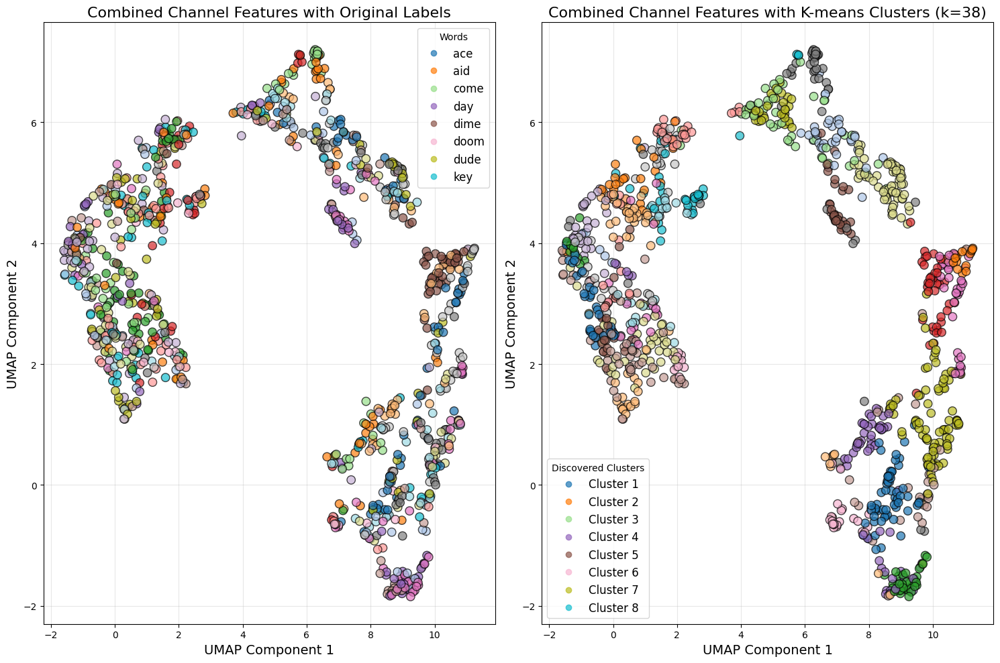

Adjusted Rand Index: 0.082
Normalized Mutual Information: 0.376


In [19]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.50, random_state=45)


# Encode labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test)

# UMAP for dimensionality reduction with both channels
umap_combined = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    metric='correlation',
    random_state=42
)
X_umap_combined = umap_combined.fit_transform(X_scaled)

# Get the number of classes from your existing labels
num_classes = len(np.unique(y_test_encoded))
print(f"Number of unique classes in the dataset: {num_classes}")

# Apply K-means with the number of clusters equal to number of classes
kmeans = KMeans(n_clusters=num_classes, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Create visualization
plt.figure(figsize=(15, 10))

# Plot with original labels
plt.subplot(1, 2, 1)
scatter1 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=y_test_encoded, 
    cmap='tab20', 
    edgecolor='k', 
    s=80, 
    alpha=0.7
)
plt.title("Combined Channel Features with Original Labels", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Add legend for original labels
handles, labels_auto = scatter1.legend_elements()
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
plt.legend(handles, labels, title="Words", loc="best", fontsize=12)

# Plot with predicted clusters
plt.subplot(1, 2, 2)
scatter2 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=clusters, 
    cmap='tab20', 
    edgecolor='k', 
    s=80, 
    alpha=0.7
)
plt.title(f"Combined Channel Features with K-means Clusters (k={num_classes})", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Add legend for clusters
handles, labels_auto = scatter2.legend_elements()
plt.legend(handles, [f"Cluster {i+1}" for i in range(len(handles))], 
           title="Discovered Clusters", loc="best", fontsize=12)

plt.tight_layout()
plt.savefig("dual_channel_clustering.png", dpi=300)
plt.show()

# Calculate and print clustering metrics
ari = adjusted_rand_score(y_test_encoded, clusters)
nmi = normalized_mutual_info_score(y_test_encoded, clusters)

print(f"Adjusted Rand Index: {ari:.3f}")
print(f"Normalized Mutual Information: {nmi:.3f}")

/home/nico/nico/torch/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/nico/nico/torch/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of unique classes in the dataset: 38


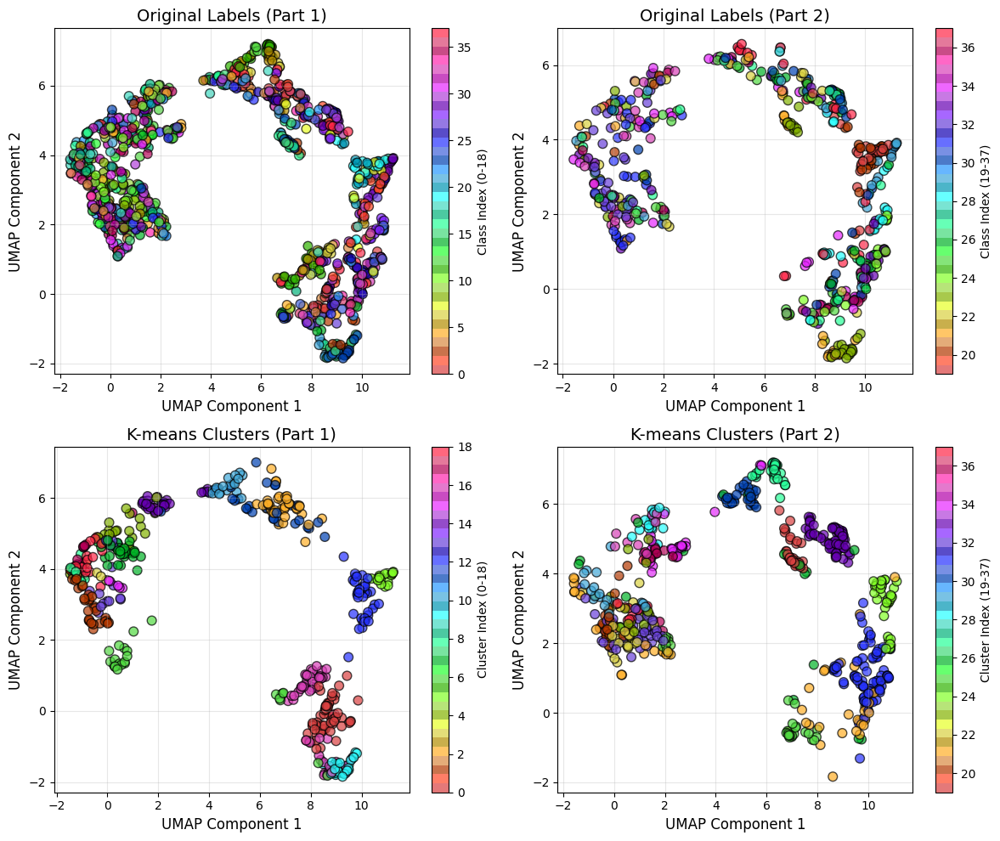

Adjusted Rand Index: 0.082
Normalized Mutual Information: 0.376


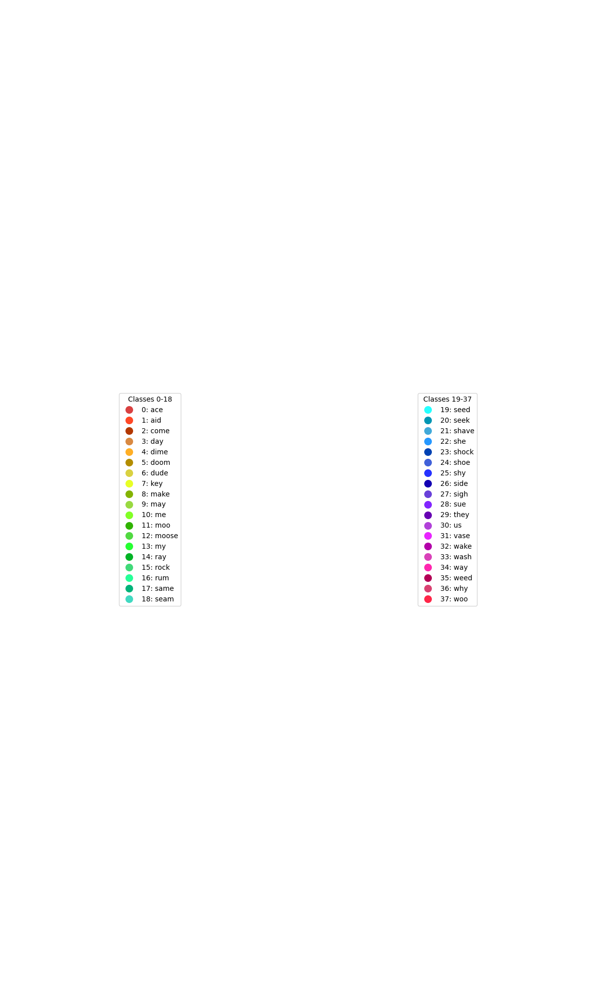

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from umap import UMAP

# Your existing code until the visualization part
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.50, random_state=45)

# Encode labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test)

# UMAP for dimensionality reduction with both channels
umap_combined = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    metric='correlation',
    random_state=42
)
X_umap_combined = umap_combined.fit_transform(X_scaled)

# Get the number of classes from your existing labels
num_classes = len(np.unique(y_test_encoded))
print(f"Number of unique classes in the dataset: {num_classes}")

# Apply K-means with the number of clusters equal to number of classes
kmeans = KMeans(n_clusters=num_classes, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Generate a large set of distinct colors using hsv colorspace
def generate_distinct_colors(n):
    import colorsys
    colors = []
    for i in range(n):
        hue = i / n
        saturation = 0.7 + 0.3 * (i % 3) / 2  # Vary saturation
        value = 0.7 + 0.3 * ((i + 1) % 3) / 2  # Vary value/brightness
        colors.append(colorsys.hsv_to_rgb(hue, saturation, value))
    return colors

# Generate colors for all classes
distinct_colors = generate_distinct_colors(num_classes)
custom_cmap = ListedColormap(distinct_colors)

# Create 4 separate plots
plt.figure(figsize=(12, 10))
plt.subplot(2, 2, 1)
scatter1 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=y_test_encoded,
    cmap=custom_cmap,
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"Original Labels (Part 1)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter1, label="Class Index (0-18)")

# Plot 2: Original Labels (Second half)
plt.subplot(2, 2, 2)
# Create a mask for the second half of classes
mask_high = np.logical_and(y_test_encoded >= num_classes//2, y_test_encoded < num_classes)
scatter2 = plt.scatter(
    X_umap_combined[mask_high, 0], 
    X_umap_combined[mask_high, 1], 
    c=y_test_encoded[mask_high],
    cmap=custom_cmap,
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"Original Labels (Part 2)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter2, label=f"Class Index (19-{num_classes-1})")

# Plot 3: K-means Clusters (First half)
plt.subplot(2, 2, 3)
mask_low_cluster = np.logical_and(clusters >= 0, clusters < num_classes//2)
scatter3 = plt.scatter(
    X_umap_combined[mask_low_cluster, 0], 
    X_umap_combined[mask_low_cluster, 1], 
    c=clusters[mask_low_cluster],
    cmap=custom_cmap,
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"K-means Clusters (Part 1)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter3, label="Cluster Index (0-18)")

# Plot 4: K-means Clusters (Second half)
plt.subplot(2, 2, 4)
mask_high_cluster = np.logical_and(clusters >= num_classes//2, clusters < num_classes)
scatter4 = plt.scatter(
    X_umap_combined[mask_high_cluster, 0], 
    X_umap_combined[mask_high_cluster, 1], 
    c=clusters[mask_high_cluster],
    cmap=custom_cmap,
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"K-means Clusters (Part 2)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter4, label=f"Cluster Index (19-{num_classes-1})")

plt.tight_layout()
plt.savefig("four_panel_clustering.png", dpi=300)
plt.show()

# Create a separate figure for the class legend (two columns)
plt.figure(figsize=(12, 20))
plt.subplot(1, 2, 1)
legend_elements1 = []
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
for i in range(num_classes//2):
    legend_elements1.append(plt.Line2D([0], [0], marker='o', color='w', 
                                     markerfacecolor=distinct_colors[i], markersize=12, 
                                     label=f"{i}: {labels[i]}"))
plt.legend(handles=legend_elements1, loc='center', fontsize=10, title="Classes 0-18")
plt.axis('off')

plt.subplot(1, 2, 2)
legend_elements2 = []
for i in range(num_classes//2, num_classes):
    legend_elements2.append(plt.Line2D([0], [0], marker='o', color='w', 
                                     markerfacecolor=distinct_colors[i], markersize=12, 
                                     label=f"{i}: {labels[i]}"))
plt.legend(handles=legend_elements2, loc='center', fontsize=10, title=f"Classes 19-{num_classes-1}")
plt.axis('off')

plt.tight_layout()
plt.savefig("classes_legend.png", dpi=300)

# Calculate and print clustering metrics
ari = adjusted_rand_score(y_test_encoded, clusters)
nmi = normalized_mutual_info_score(y_test_encoded, clusters)
print(f"Adjusted Rand Index: {ari:.3f}")
print(f"Normalized Mutual Information: {nmi:.3f}")

/home/nico/nico/torch/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/nico/nico/torch/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of unique classes in the dataset: 38


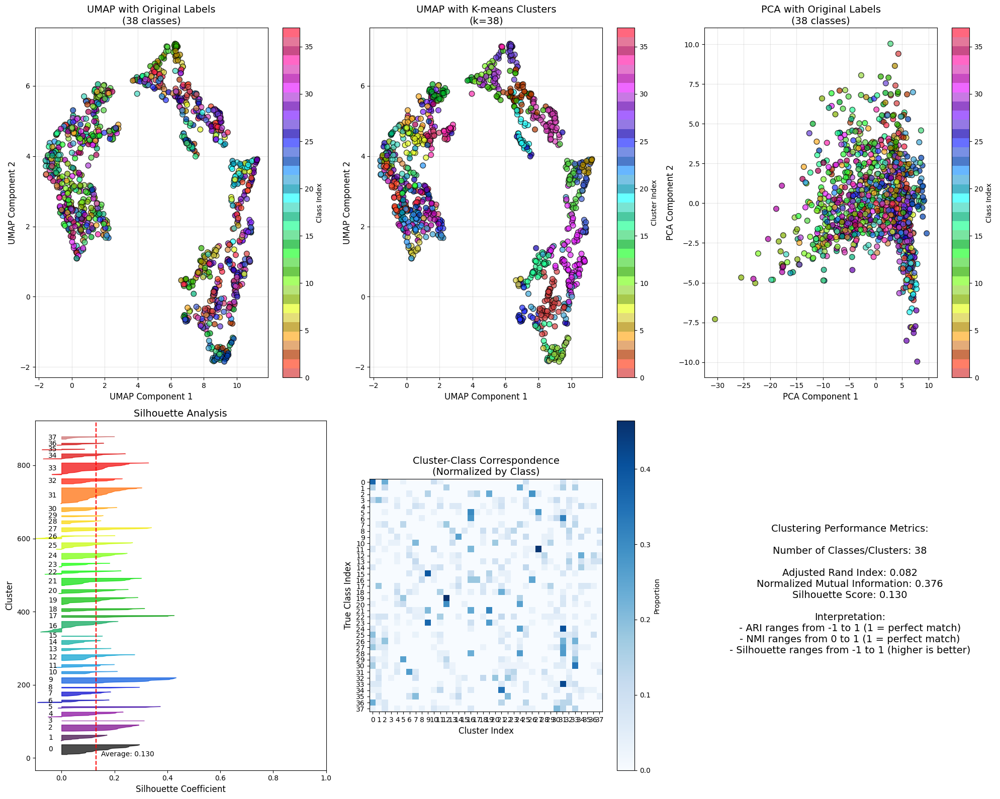

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from sklearn.decomposition import PCA
from umap import UMAP

# Your existing code until the visualization part
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.50, random_state=45)

# Encode labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test)

# UMAP for dimensionality reduction with both channels
umap_combined = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    metric='correlation',
    random_state=42
)
X_umap_combined = umap_combined.fit_transform(X_scaled)

# Also perform PCA for comparison
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Get the number of classes from your existing labels
num_classes = len(np.unique(y_test_encoded))
print(f"Number of unique classes in the dataset: {num_classes}")

# Apply K-means with the number of clusters equal to number of classes
kmeans = KMeans(n_clusters=num_classes, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Generate distinct colors for all classes
def generate_distinct_colors(n):
    import colorsys
    colors = []
    for i in range(n):
        hue = i / n
        saturation = 0.7 + 0.3 * (i % 3) / 2
        value = 0.7 + 0.3 * ((i + 1) % 3) / 2
        colors.append(colorsys.hsv_to_rgb(hue, saturation, value))
    return colors

distinct_colors = generate_distinct_colors(num_classes)
custom_cmap = ListedColormap(distinct_colors)

# Calculate metrics
ari = adjusted_rand_score(y_test_encoded, clusters)
nmi = normalized_mutual_info_score(y_test_encoded, clusters)
silhouette = silhouette_score(X_scaled, clusters) if len(np.unique(clusters)) > 1 else 0

# Set up the figure for all 5 graphs
plt.figure(figsize=(20, 16))

# Graph 1: UMAP with original labels
plt.subplot(2, 3, 1)
scatter1 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=y_test_encoded, 
    cmap=custom_cmap, 
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"UMAP with Original Labels\n({num_classes} classes)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter1, label="Class Index")

# Graph 2: UMAP with K-means clusters
plt.subplot(2, 3, 2)
scatter2 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=clusters, 
    cmap=custom_cmap, 
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"UMAP with K-means Clusters\n(k={num_classes})", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter2, label="Cluster Index")

# Graph 3: PCA with original labels
plt.subplot(2, 3, 3)
scatter3 = plt.scatter(
    X_pca[:, 0], 
    X_pca[:, 1], 
    c=y_test_encoded, 
    cmap=custom_cmap, 
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"PCA with Original Labels\n({num_classes} classes)", fontsize=14)
plt.xlabel("PCA Component 1", fontsize=12)
plt.ylabel("PCA Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter3, label="Class Index")

# Graph 4: Silhouette analysis 
plt.subplot(2, 3, 4)
from sklearn.metrics import silhouette_samples

silhouette_values = silhouette_samples(X_scaled, clusters)
y_lower = 10

# Plot average silhouette score
plt.axvline(x=silhouette, color="red", linestyle="--")
plt.text(silhouette + 0.02, y_lower, f"Average: {silhouette:.3f}", 
         va='center', fontsize=10)

# Sample a subset for visualization if too many points
if len(clusters) > 500:
    sample_indices = np.random.choice(len(clusters), 500, replace=False)
    silhouette_subset = silhouette_values[sample_indices]
    clusters_subset = clusters[sample_indices]
    unique_clusters = np.unique(clusters_subset)
else:
    silhouette_subset = silhouette_values
    clusters_subset = clusters
    unique_clusters = np.unique(clusters)

for i in range(len(unique_clusters)):
    cluster_silhouette_values = silhouette_subset[clusters_subset == unique_clusters[i]]
    cluster_silhouette_values.sort()
    size_cluster_i = cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    
    color = plt.cm.nipy_spectral(float(i) / len(unique_clusters))
    plt.fill_betweenx(np.arange(y_lower, y_upper),
                      0, cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)
    
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(unique_clusters[i]), va='center')
    y_lower = y_upper + 10

plt.title("Silhouette Analysis", fontsize=14)
plt.xlabel("Silhouette Coefficient", fontsize=12)
plt.ylabel("Cluster", fontsize=12)
plt.xlim([-0.1, 1])
plt.tight_layout()

# Graph 5: Confusion matrix-like visualization
plt.subplot(2, 3, 5)
conf_mat = np.zeros((num_classes, num_classes))
for i in range(len(y_test_encoded)):
    conf_mat[y_test_encoded[i], clusters[i]] += 1

# Normalize by row
conf_mat_norm = conf_mat / conf_mat.sum(axis=1, keepdims=True)

plt.imshow(conf_mat_norm, interpolation='nearest', cmap='Blues')
plt.colorbar(label='Proportion')
plt.title("Cluster-Class Correspondence\n(Normalized by Class)", fontsize=14)
plt.xlabel("Cluster Index", fontsize=12)
plt.ylabel("True Class Index", fontsize=12)
plt.xticks(np.arange(num_classes), np.arange(num_classes))
plt.yticks(np.arange(num_classes), np.arange(num_classes))

# Add metrics text in the remaining space
plt.subplot(2, 3, 6)
plt.axis('off')
metrics_text = (
    f"Clustering Performance Metrics:\n\n"
    f"Number of Classes/Clusters: {num_classes}\n\n"
    f"Adjusted Rand Index: {ari:.3f}\n"
    f"Normalized Mutual Information: {nmi:.3f}\n"
    f"Silhouette Score: {silhouette:.3f}\n\n"
    f"Interpretation:\n"
    f"- ARI ranges from -1 to 1 (1 = perfect match)\n"
    f"- NMI ranges from 0 to 1 (1 = perfect match)\n"
    f"- Silhouette ranges from -1 to 1 (higher is better)\n"
)
plt.text(0.5, 0.5, metrics_text, ha='center', va='center', fontsize=14)

plt.tight_layout()
plt.savefig("clustering_five_graphs.png", dpi=300, bbox_inches='tight')
plt.show()

# Optional: Create a separate legend figure if needed
class_labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
if len(class_labels) <= 20:  # Only create if manageable number of classes
    plt.figure(figsize=(12, 10))
    legend_elements = []
    for i, label in enumerate(class_labels):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', 
                                        markerfacecolor=distinct_colors[i], markersize=15, 
                                        label=f"{i}: {label}"))
    plt.axis('off')
    plt.legend(handles=legend_elements, loc='center', fontsize=12, ncol=3)
    plt.tight_layout()
    plt.savefig("class_legend.png", dpi=300)

/home/nico/nico/torch/lib/python3.12/site-packages/librosa/feature/spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


2245
(2245, 64)


/home/nico/nico/torch/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/nico/nico/torch/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of unique classes in the dataset: 38


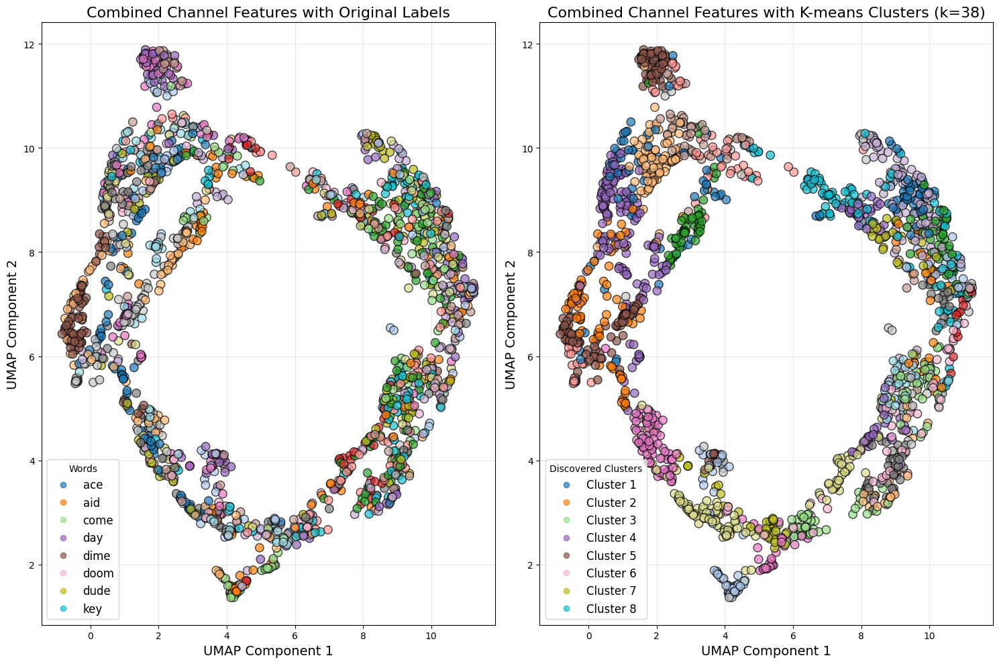

Adjusted Rand Index: 0.082
Normalized Mutual Information: 0.337


/home/nico/nico/torch/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/nico/nico/torch/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nico/nico/torch/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/nico/nico/torch/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


ValueError: 'c' argument has 1909 elements, which is inconsistent with 'x' and 'y' with size 1123.

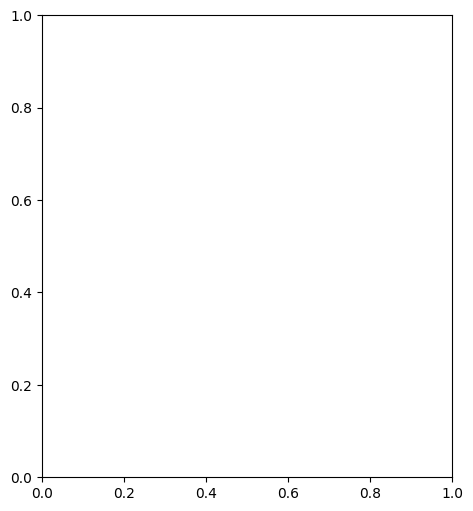

In [22]:


# Extract features from both channels
X_speech_channel1 = extract_speech_features(adc1segmentsX)
X_speech_channel2 = extract_speech_features(adc2segmentsX)
y = np.array(segmentsY)
print(len(adc1segmentsX))
print(X_speech_channel1.shape)
# print(X_speech_channel1[0][32:].mean())
# print(X_speech_channel1[1][32:].mean())
# print(X_speech_channel1[2][32:].mean())
# print(X_speech_channel1[20][32:].mean())
# print(X_speech_channel1[21][32:].mean())
# print(X_speech_channel1[22][32:].mean())
# Approach 1: Concatenate features from both channels
# This creates a feature vector with twice the dimensions
X_combined = np.hstack([X_speech_channel1, X_speech_channel2])
X_combined = X_speech_channel2


# Encode labels first
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Then split the data
X_train, X_test, y_train_encoded, y_test_encoded = train_test_split(
    X_combined, y_encoded, 
    test_size=0.85, 
    random_state=45,
    stratify=y_encoded  # Still use stratification
)
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test)

# UMAP for dimensionality reduction with both channels
umap_combined = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    metric='correlation',
    random_state=42
)
X_umap_combined = umap_combined.fit_transform(X_scaled)

# Get the number of classes from your existing labels
num_classes = len(np.unique(y_test_encoded))
print(f"Number of unique classes in the dataset: {num_classes}")

# Apply K-means with the number of clusters equal to number of classes
kmeans = KMeans(n_clusters=num_classes, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Create visualization
plt.figure(figsize=(15, 10))

# Plot with original labels
plt.subplot(1, 2, 1)
scatter1 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=y_test_encoded, 
    cmap='tab20', 
    edgecolor='k', 
    s=80, 
    alpha=0.7
)
plt.title("Combined Channel Features with Original Labels", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Add legend for original labels
handles, labels_auto = scatter1.legend_elements()
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
plt.legend(handles, labels, title="Words", loc="best", fontsize=12)

# Plot with predicted clusters
plt.subplot(1, 2, 2)
scatter2 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=clusters, 
    cmap='tab20', 
    edgecolor='k', 
    s=80, 
    alpha=0.7
)
plt.title(f"Combined Channel Features with K-means Clusters (k={num_classes})", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Add legend for clusters
handles, labels_auto = scatter2.legend_elements()
plt.legend(handles, [f"Cluster {i+1}" for i in range(len(handles))], 
           title="Discovered Clusters", loc="best", fontsize=12)

plt.tight_layout()
plt.savefig("dual_channel_clustering.png", dpi=300)
plt.show()

# Calculate and print clustering metrics
ari = adjusted_rand_score(y_test_encoded, clusters)
nmi = normalized_mutual_info_score(y_test_encoded, clusters)

print(f"Adjusted Rand Index: {ari:.3f}")
print(f"Normalized Mutual Information: {nmi:.3f}")

# -------------------------
# Alternative Approach: Create a comparison of individual channels vs combined
# -------------------------

# Scale individual channel features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
X_ch1_test = scaler1.fit_transform(X_speech_channel1[y_train.shape[0]:])  # Using same indices as test set
X_ch2_test = scaler2.fit_transform(X_speech_channel2[y_train.shape[0]:])  # Using same indices as test set

# print(X_speech_channel1.shape, X_speech_channel2.shape, X_combined.shape)

# UMAP for each individual channel
umap_ch1 = UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation', random_state=42)
umap_ch2 = UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation', random_state=42)

X_umap_ch1 = umap_ch1.fit_transform(X_ch1_test)
X_umap_ch2 = umap_ch2.fit_transform(X_ch2_test)

# Create 3-panel visualization comparing the channels
plt.figure(figsize=(18, 6))

# Channel 1
plt.subplot(1, 3, 1)
scatter1 = plt.scatter(X_umap_ch1[:, 0], X_umap_ch1[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Channel 1 Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Channel 2
plt.subplot(1, 3, 2)
scatter2 = plt.scatter(X_umap_ch2[:, 0], X_umap_ch2[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Channel 2 Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Combined channels
plt.subplot(1, 3, 3)
scatter3 = plt.scatter(X_umap_combined[:, 0], X_umap_combined[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Combined Channel Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.1)

# Add legend
handles, labels_auto = scatter3.legend_elements()
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
plt.figlegend(handles, labels, title="Words", loc="lower center", ncol=min(5, len(labels)), bbox_to_anchor=(0.5, 0), fontsize=12)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.savefig("channel_comparison.png", dpi=300)
plt.show()

# Calculate clustering metrics for each approach to determine which is best
kmeans_ch1 = KMeans(n_clusters=num_classes, random_state=42, n_init=10).fit_predict(X_ch1_test)
kmeans_ch2 = KMeans(n_clusters=num_classes, random_state=42, n_init=10).fit_predict(X_ch2_test)

ari_ch1 = adjusted_rand_score(y_test_encoded, kmeans_ch1)
ari_ch2 = adjusted_rand_score(y_test_encoded, kmeans_ch2)
ari_combined = ari  # from earlier calculation

print("\nClustering Performance Comparison:")
print(f"Channel 1 only - ARI: {ari_ch1:.3f}")
print(f"Channel 2 only - ARI: {ari_ch2:.3f}")
print(f"Combined channels - ARI: {ari_combined:.3f}")
print("\nThe higher the ARI score (max 1.0), the better the clustering matches the true labels.")

In [ ]:
# -------------------------
# Alternative Approach: Create a comparison of individual channels vs combined
# -------------------------

# Scale individual channel features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
X_ch1_test = scaler1.fit_transform(X_speech_channel1[y_train.shape[0]:])  # Using same indices as test set
X_ch2_test = scaler2.fit_transform(X_speech_channel2[y_train.shape[0]:])  # Using same indices as test set

# print(X_speech_channel1.shape, X_speech_channel2.shape, X_combined.shape)

# UMAP for each individual channel
umap_ch1 = UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation', random_state=42)
umap_ch2 = UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation', random_state=42)

X_umap_ch1 = umap_ch1.fit_transform(X_ch1_test)
X_umap_ch2 = umap_ch2.fit_transform(X_ch2_test)

# Create 3-panel visualization comparing the channels
plt.figure(figsize=(18, 6))

# Channel 1
plt.subplot(1, 3, 1)
scatter1 = plt.scatter(X_umap_ch1[:, 0], X_umap_ch1[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Channel 1 Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Channel 2
plt.subplot(1, 3, 2)
scatter2 = plt.scatter(X_umap_ch2[:, 0], X_umap_ch2[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Channel 2 Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Combined channels
plt.subplot(1, 3, 3)
scatter3 = plt.scatter(X_umap_combined[:, 0], X_umap_combined[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Combined Channel Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.1)

# Add legend
handles, labels_auto = scatter3.legend_elements()
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
plt.figlegend(handles, labels, title="Words", loc="lower center", ncol=min(5, len(labels)), bbox_to_anchor=(0.5, 0), fontsize=12)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.savefig("channel_comparison.png", dpi=300)
plt.show()

# Calculate clustering metrics for each approach to determine which is best
kmeans_ch1 = KMeans(n_clusters=num_classes, random_state=42, n_init=10).fit_predict(X_ch1_test)
kmeans_ch2 = KMeans(n_clusters=num_classes, random_state=42, n_init=10).fit_predict(X_ch2_test)

ari_ch1 = adjusted_rand_score(y_test_encoded, kmeans_ch1)
ari_ch2 = adjusted_rand_score(y_test_encoded, kmeans_ch2)
ari_combined = ari  # from earlier calculation

print("\nClustering Performance Comparison:")
print(f"Channel 1 only - ARI: {ari_ch1:.3f}")
print(f"Channel 2 only - ARI: {ari_ch2:.3f}")
print(f"Combined channels - ARI: {ari_combined:.3f}")
print("\nThe higher the ARI score (max 1.0), the better the clustering matches the true labels.")